# Effect of the same fault injected at different moment in the algorithm execution

In [1]:
%matplotlib inline

In [2]:
# For plotting
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import LogNorm
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

# For parsing Matrix files
import scipy.io

import numpy as np

## Import modules

In [3]:
from Experiment import *
from Parameters import *
from Fault import *
from Algorithm import *

## Define inputs

In [4]:
inputs = []

In [5]:
def load_mat(path='./arc130.mat'):
    
    try:
        A = scipy.io.loadmat(path)['Problem'][0][0][1].toarray()
    except:
        A = scipy.io.loadmat(path)['Problem'][0][0][2].toarray()
    print A
    n = A.shape[0]
    x = np.ones((n, 1))
    b = A.dot(x)
    x = np.zeros((n, 1))
    return A, x, b

[[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0. -1.]]
150.506311019
3.47848884194e-07


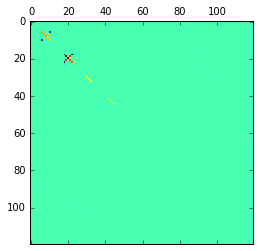

In [6]:
mat_path = './arc130.mat'
mat_path = './gre_216a.mat'
mat_path = './mcca.mat'
mat_path = './robot.mat'

A, x, b = load_mat(mat_path)
plt.matshow(A)
n = A.shape[0]
u, s, v = np.linalg.svd(A)
print s[0]
print s[-1]

In [7]:
inputs += [{"A": A, "b": b, "x0": x}]

## Define the algorithm

In [8]:
import gmres

#### Algorithm parameters

In [9]:
# parameters that won't change during the whole experiment
algorithm_parameters = Parameters()
algorithm_parameters["m"] = n
algorithm_parameters["tol"] = 1.e-12
algorithm_parameters["iterMax"] = n
algorithm_parameters["orthMethod"] = gmres.modified_gramschmidt
algorithm_parameters["dtype"] = 'd'
algorithm_parameters["vulnerable"] = True
algorithm_parameters["save_data"] = {"iteration_count",
                                     "residual",
                                     "residuals",
                                     "true_residual",
                                     "true_residuals",
                                     "orthogonality",
                                     "arnoldi",
                                     "faults",
                                     "H",
                                     "V",
                                     "y"}


#### Implementation (gmres)

In [10]:
def implementation(self, input, algorithm_parameters, experiment_parameters, save_data=True, display=False):
    gmres.implementation(self, input, algorithm_parameters, experiment_parameters, save_data, display)

In [11]:
gmres_algorithm = Algorithm(algorithm_parameters, implementation)

## Run the experiment

### Define the experiment parameters

In [12]:
from sys import stdout

experiment_parameters_without_fault = Parameters()

experiment_parameters_without_fault["vulnerable"] = False

orthMethods = []
orthMethods += [gmres.modified_gramschmidt]
orthMethods += [gmres.classical_gramschmidt]
orthMethods += [lambda w, V, H, i: gmres.modified_gramschmidt(w, V, H, i, True)]
  


def experiment_parameters_generator():
    parameters = Parameters()
    parameters["vulnerable"] = True
    
    fault_parameters = {}
    fault_parameters["fault_callback"] = lambda fault: (stdout.write(" %s " % str(fault)))
    fault_parameters["register"] = "left"
    
    while (True):
        fault_parameters["vulnerable_bits"] = [int(np.random.rand() * 64)]
        fault_parameters["fault_indices"] = {"i": int(np.random.rand()*n), 
                                             "j":0, 
                                             "k":int(np.random.rand()*n)}
        fault_parameters["timer"] = int(np.random.rand() * 150)
        
        parameters["fault_parameters"] = fault_parameters
        
        step = 5
        for i in xrange(118 / step + 1):
            fault_parameters["timer"] = step * i
            yield parameters



### Setup the experiment (algorithm, parameters and inputs)

In [13]:
# Experiment without fault
F = Experiment(experiment_parameters_without_fault, gmres_algorithm)
F.set_inputs(inputs)
F.run(show_progress=True, n=1)

print F.get_data("faults")

Complete ! 
[[]]


In [14]:
# Experiment with fault
E = Experiment(experiment_parameters_generator(), gmres_algorithm)
E.set_inputs(inputs)
E.run(show_progress=True, n=(118/5 + 1)*5)

66 % 

gmres.py:104: RuntimeWarning: overflow encountered in double_scalars
  mu = np.sqrt(H[i, i]**2 + H[i+1, i]**2)
gmres.py:106: RuntimeWarning: invalid value encountered in double_scalars
  sn_i = -H[i+1, i] / mu


Complete ! 


## Display the experiment result

In [15]:
E.get_results()[0]

({'A': array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         ..., 
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ...,  0.,  0., -1.]]), 'b': array([[  0.00000000e+00],
         [  0.00000000e+00],
         [  0.00000000e+00],
         [  4.99015074e-02],
         [  2.85148926e-02],
         [  8.05533040e-01],
         [  7.25615958e+00],
         [  8.79856296e+01],
         [  5.15474296e+01],
         [  7.74078426e+01],
         [ -1.07789842e+00],
         [ -5.64298042e+00],
         [  1.00000000e+00],
         [  1.00000000e+00],
         [  1.00000000e+00],
         [ -2.35162707e-01],
         [  1.68759688e+00],
         [ -1.67347701e+00],
         [  7.07333958e+00],
         [  1.60821765e+02],
         [  1.03814114e+02],
         [  1.48750056e+02],
         [  2.45866183e+00],
         [ -1.19871752e+00],
   

## Display the experiment data

In [16]:
E.get_data()[0]

{'H': array([[  1.30862924e+02,   6.06201330e+01,   9.95156620e+00, ...,
           8.18677763e-02,  -3.93523368e+01,   1.18572872e+02],
        [  0.00000000e+00,   7.12121833e+01,   5.62227479e+01, ...,
          -3.87807471e-02,  -1.02648710e+01,   3.10051301e+01],
        [  0.00000000e+00,   0.00000000e+00,   4.30286039e+01, ...,
          -1.15077088e-01,   1.77839275e+00,  -5.31245496e+00],
        ..., 
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   9.49127382e-01,   3.14897826e-01],
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   0.00000000e+00,   4.42018922e-07],
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   0.00000000e+00,   0.00000000e+00]]),
 'V': array([[  0.00000000e+00,  -1.67360740e-04,   1.04538477e-03, ...,
           3.36607843e-02,   1.74337846e-02,  -6.32774748e-03],
        [  0.00000000e+00,  -2.71409897e-05,   5.8

## Plot convergence history

In [17]:
def plot_2D(X, Y, title = '', grid = True, label = "", log=False, linestyle = None, xlabel = None, ylabel = None, xlim = None, ylim = None):

    if log:
        p = plt.semilogy(X, Y[:len(X)], label=label)
    else:
        p = plt.plot(X, Y[:len(X)], label=label)
    if linestyle:
        plt.setp(p, linestyle=linestyle) 
    plt.title(title)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)
    if xlabel:
        plt.xlabel(xlabel)
    if ylabel:
        plt.ylabel(ylabel)
    if grid:
        plt.grid(True)


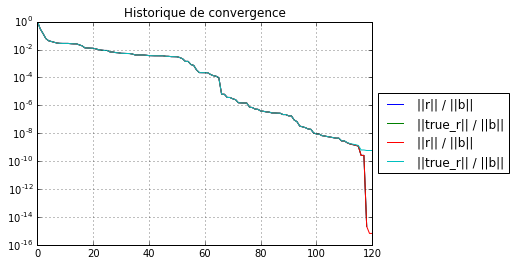

In [18]:
X = np.arange(0, F.get_data('iteration_count')[0]+1)
Y = F.get_data('residuals')[0]
Z = F.get_data('true_residuals')[0]

plot_2D(X, Y, log=True, title='Historique de convergence', label = "||r|| / ||b||", xlim=[0, 200], ylim=[1., 1.e-16])
plot_2D(X, Z, log=True, title='Historique de convergence', label = "||true_r|| / ||b||", xlim=[0, 210], ylim=[1., 1.e-16])
X = np.arange(0, E.get_data('iteration_count')[0]+1)
Y = E.get_data('residuals')[0]
Z = E.get_data('true_residuals')[0]

plot_2D(X, Y, log=True, title='Historique de convergence', label = "||r|| / ||b||", xlim=[0, 120], ylim=[1.e-16, 1])
plot_2D(X, Z, log=True, title='Historique de convergence', label = "||true_r|| / ||b||", xlim=[0, 120], ylim=[1.e-16, 1.])


{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.0010604695104979157, 'register': 'left', 'timer': 0, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.0010605234487664752, 'check': None}


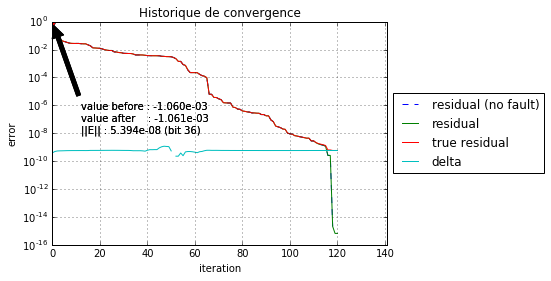

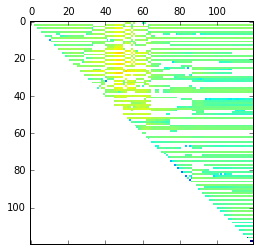

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.095712523140276534, 'register': 'left', 'timer': 5, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.0957131775179908, 'check': None}


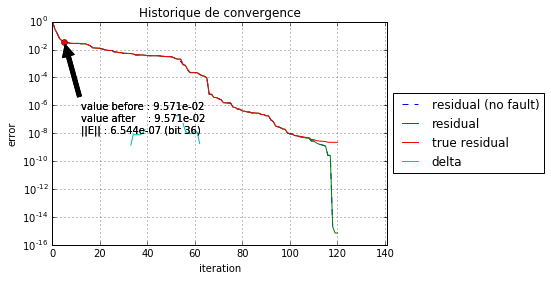

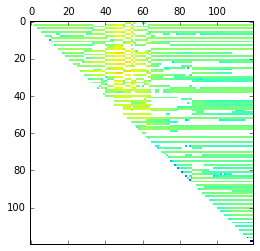

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.085035539030044793, 'register': 'left', 'timer': 10, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.085036171261921506, 'check': None}


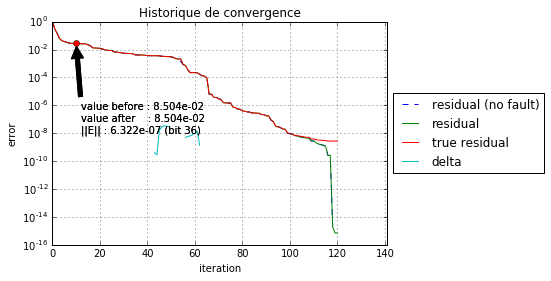

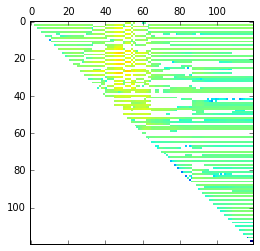

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.43136780903758787, 'register': 'left', 'timer': 15, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.4313711419891077, 'check': None}


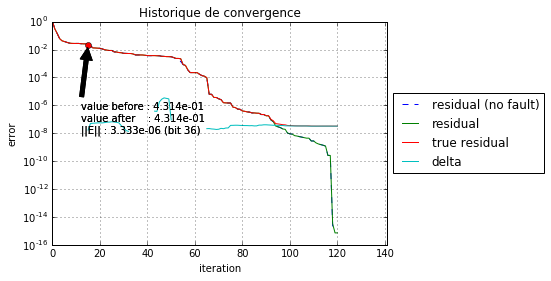

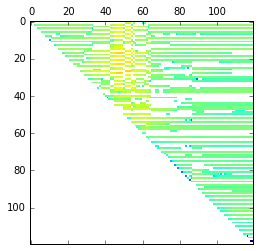

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.13587056750768384, 'register': 'left', 'timer': 20, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.13587159776174662, 'check': None}


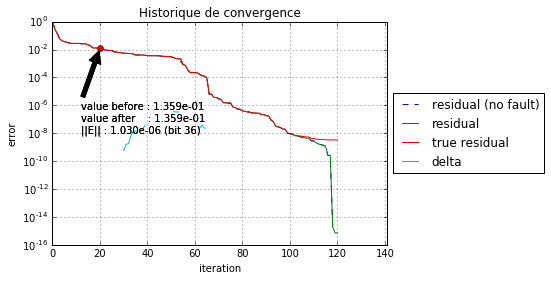

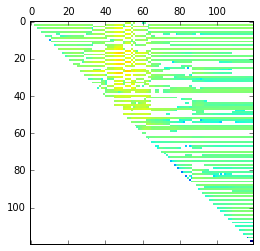

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.011794418470147203, 'register': 'left', 'timer': 25, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.011794505050745282, 'check': None}


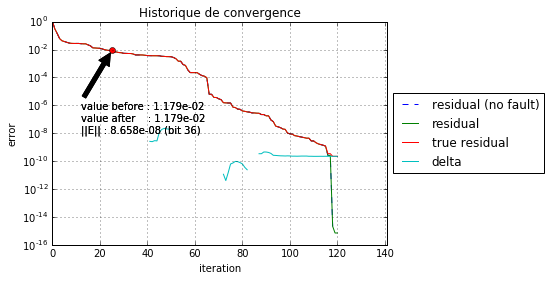

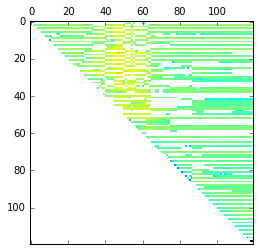

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.020871012880294838, 'register': 'left', 'timer': 30, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.020871193534220164, 'check': None}


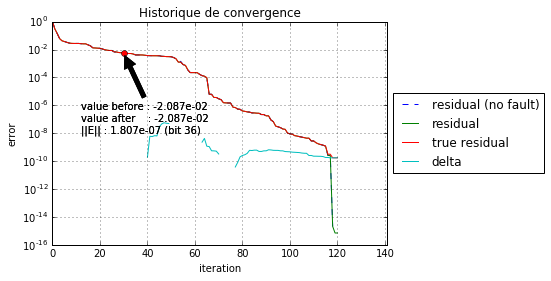

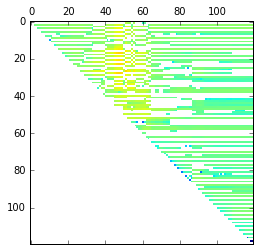

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.012988011719232438, 'register': 'left', 'timer': 35, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.012988112971010846, 'check': None}


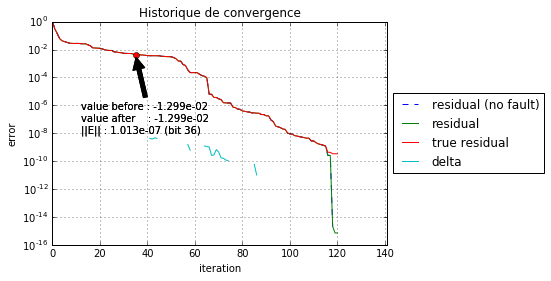

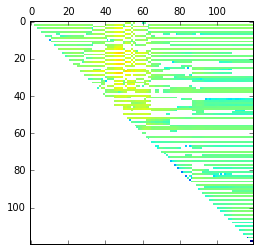

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.016984222164686785, 'register': 'left', 'timer': 40, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.016984442523151677, 'check': None}


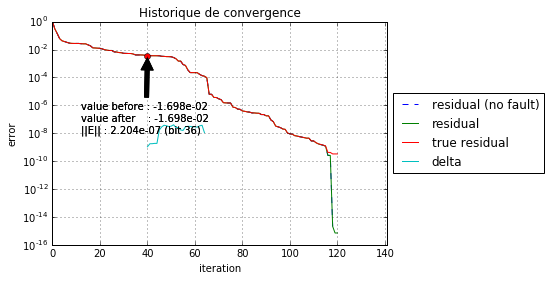

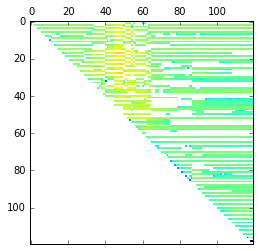

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.09852080898176091, 'register': 'left', 'timer': 45, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.098521522770756556, 'check': None}


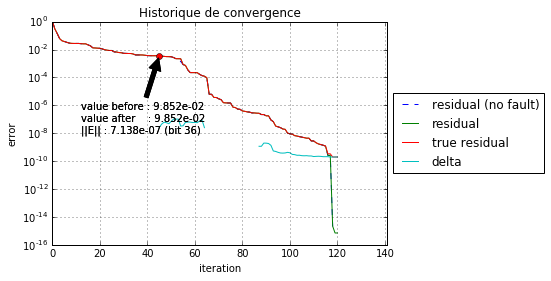

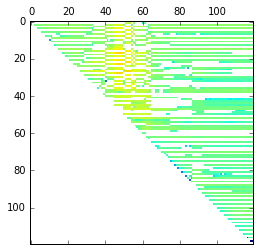

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.0271415301920425, 'register': 'left', 'timer': 50, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.027141736859600904, 'check': None}


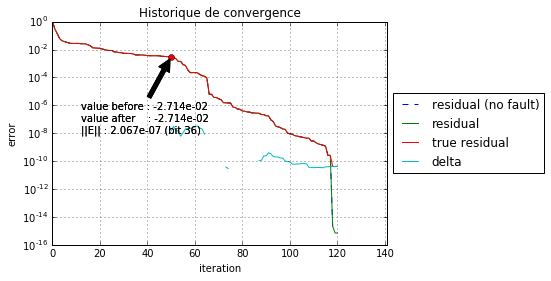

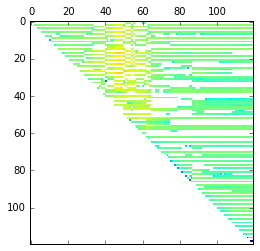

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.15459841999552804, 'register': 'left', 'timer': 55, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.15459964741455826, 'check': None}


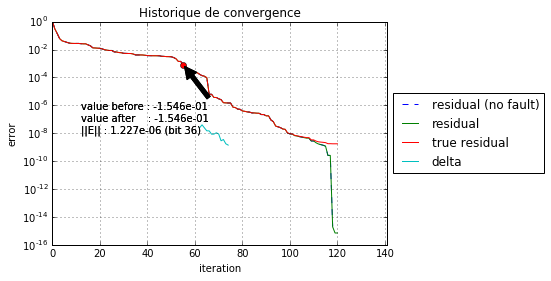

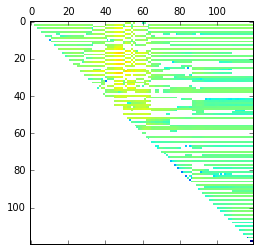

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -4.1873218263637196e-05, 'register': 'left', 'timer': 60, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -4.1907714679376325e-05, 'check': None}


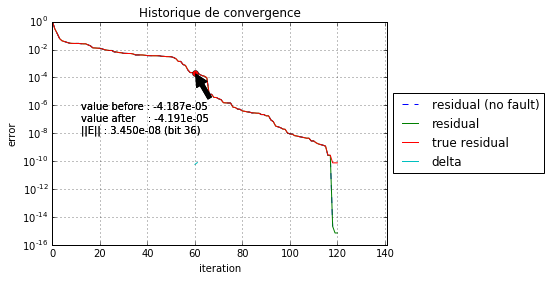

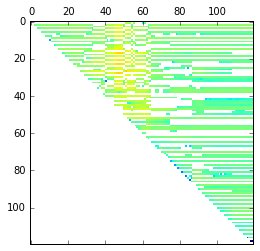

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.00094409559782153299, 'register': 'left', 'timer': 65, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.00094414504846638408, 'check': None}


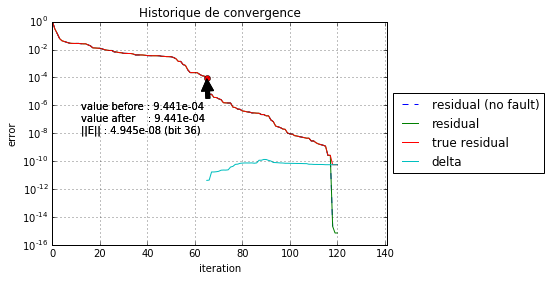

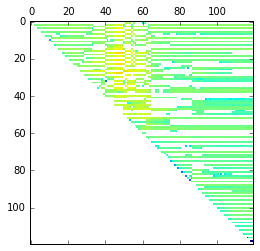

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.020190054276525062, 'register': 'left', 'timer': 70, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.020190311783105607, 'check': None}


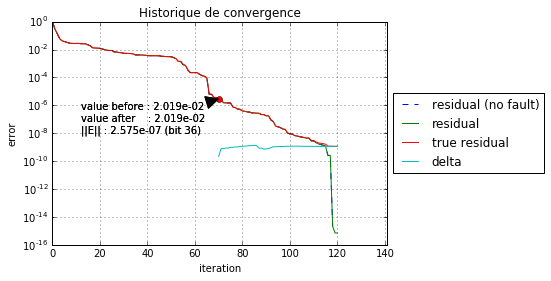

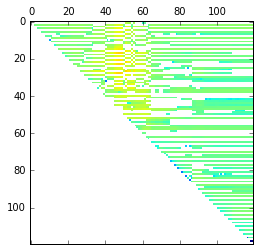

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.035942011479304287, 'register': 'left', 'timer': 75, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.035942311864823009, 'check': None}


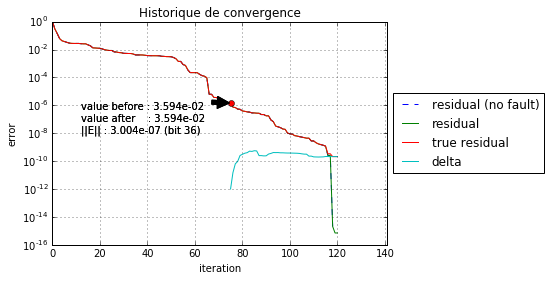

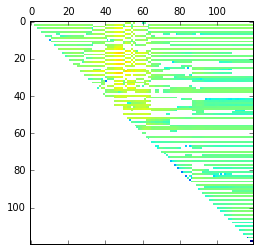

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.039422542948047118, 'register': 'left', 'timer': 80, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.039422552453118709, 'check': None}


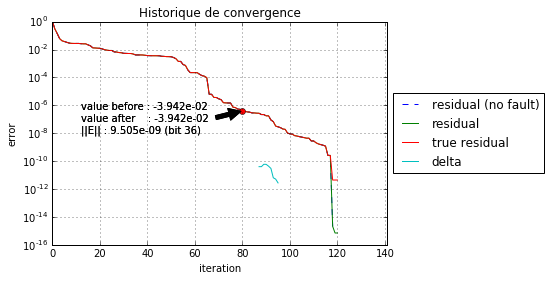

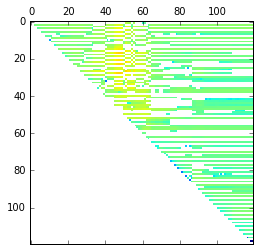

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.021776130013271285, 'register': 'left', 'timer': 85, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.021776687938699794, 'check': None}


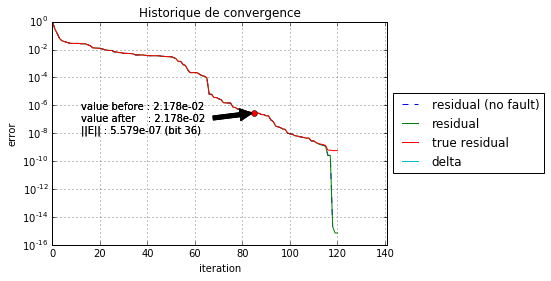

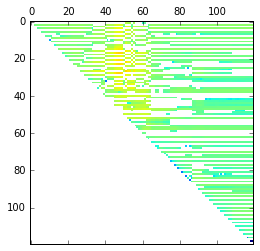

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.025956202439408816, 'register': 'left', 'timer': 90, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.025956602184245902, 'check': None}


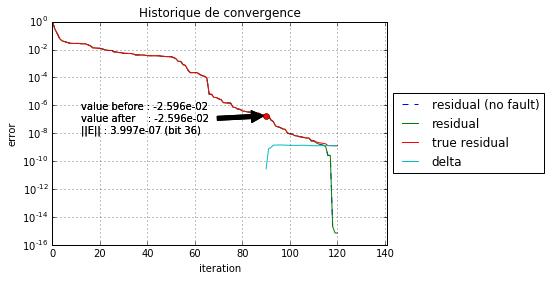

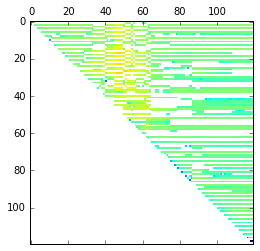

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.001237806885983966, 'register': 'left', 'timer': 95, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.0012375933041848981, 'check': None}


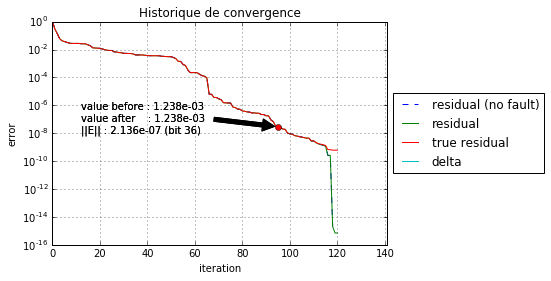

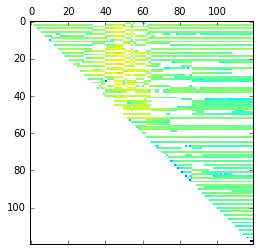

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.034575349825908319, 'register': 'left', 'timer': 100, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.034572303530859355, 'check': None}


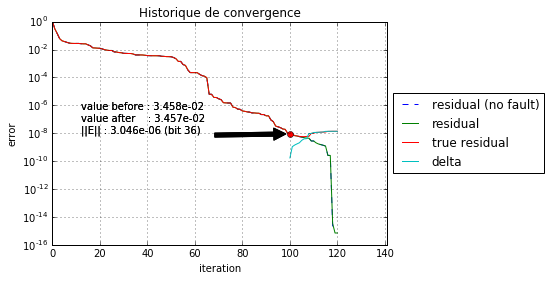

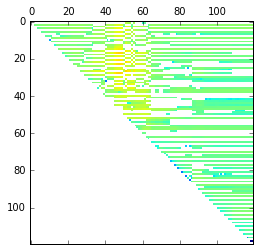

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.047627535995798914, 'register': 'left', 'timer': 105, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.047626975944963221, 'check': None}


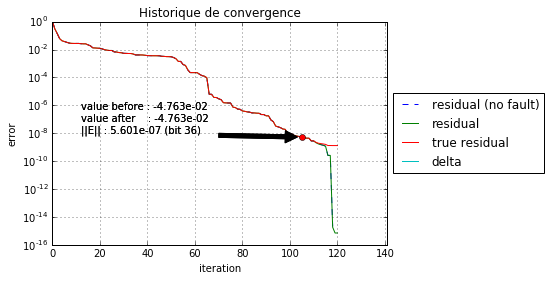

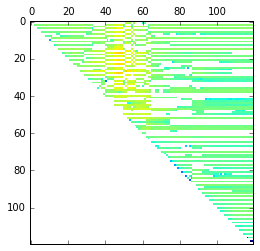

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': -0.0042235218938480451, 'register': 'left', 'timer': 110, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': -0.0042233440521082487, 'check': None}


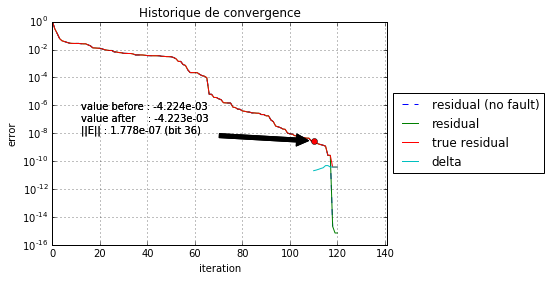

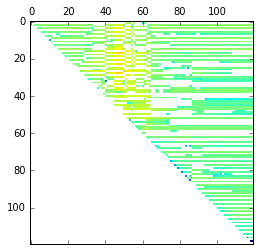

animation
{'register_before': -1.0, 'loc': {'i': 1, 'k': 79, 'j': 0}, 'value_before': 0.0049279589163897415, 'register': 'left', 'timer': 115, 'register_after': -1.0000152587890625, 'bit': 36, 'value_after': 0.0049283016417422526, 'check': None}


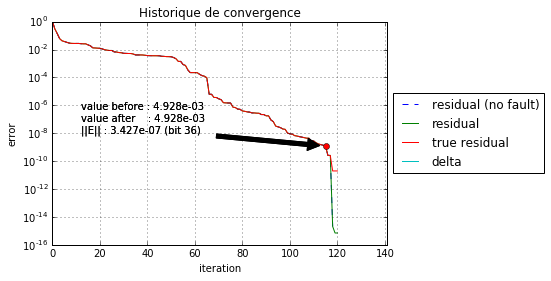

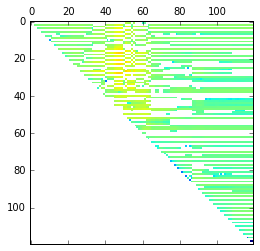

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.0029299621440589401, 'register': 'left', 'timer': 0, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.0029299621440589388, 'check': True}


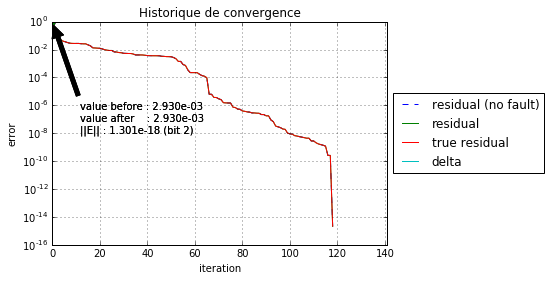

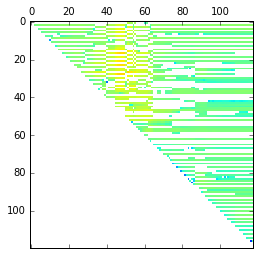

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': -0.0022980045801248728, 'register': 'left', 'timer': 5, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': -0.0022980045801248719, 'check': True}


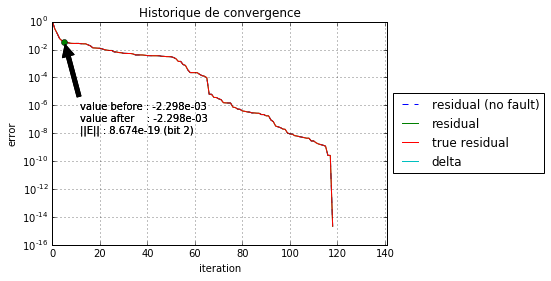

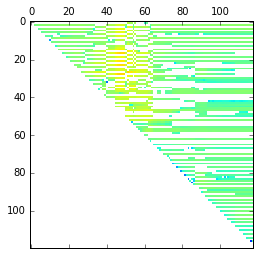

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.011096056604896052, 'register': 'left', 'timer': 10, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.011096056604896046, 'check': True}


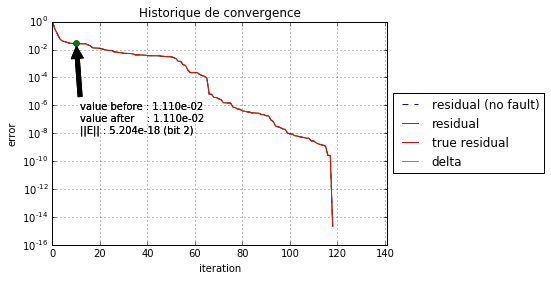

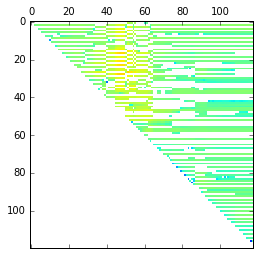

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': -0.0081369929458395621, 'register': 'left', 'timer': 15, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': -0.0081369929458395517, 'check': True}


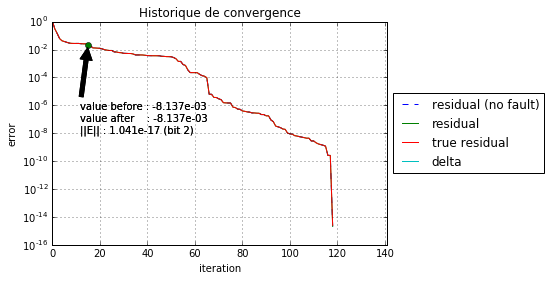

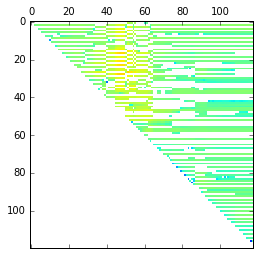

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': -0.0021781670392155813, 'register': 'left', 'timer': 20, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': -0.0021781670392155795, 'check': True}


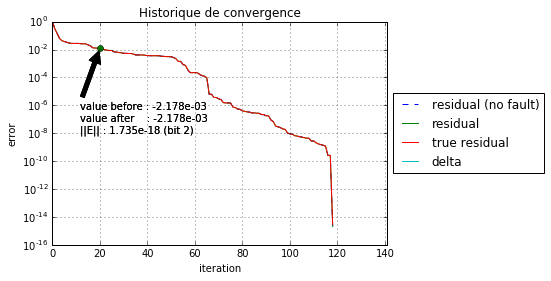

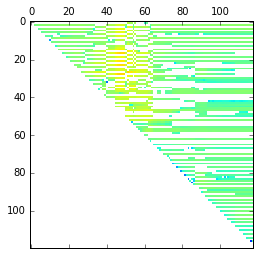

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': -0.074265969220308439, 'register': 'left', 'timer': 25, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': -0.074265969220308467, 'check': True}


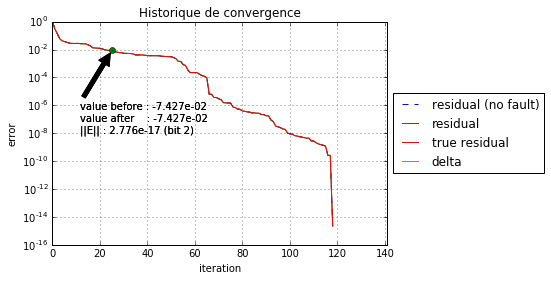

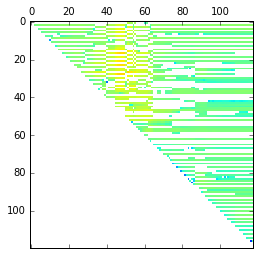

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': -0.011806721083252937, 'register': 'left', 'timer': 30, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': -0.011806721083252935, 'check': True}


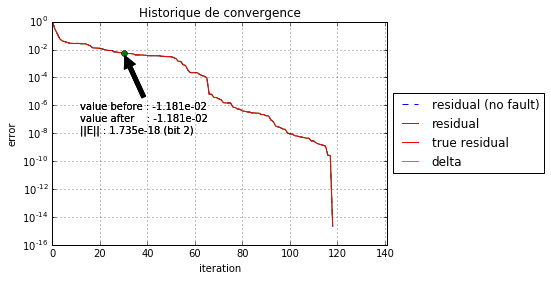

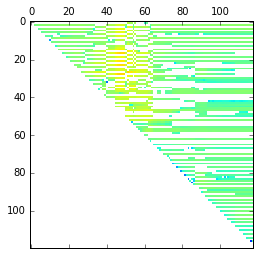

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.00038107560177411289, 'register': 'left', 'timer': 35, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.00038107560177411462, 'check': True}


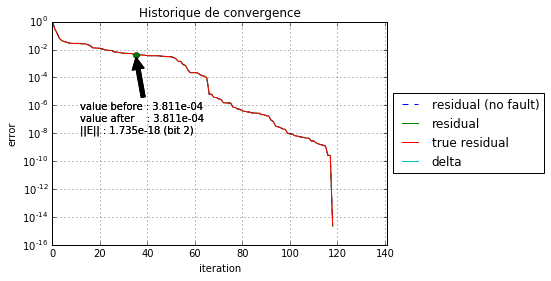

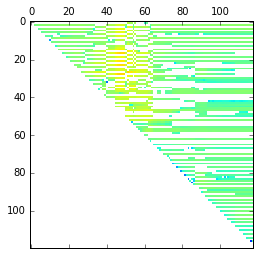

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.00097405240585946018, 'register': 'left', 'timer': 40, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.00097405240585945758, 'check': True}


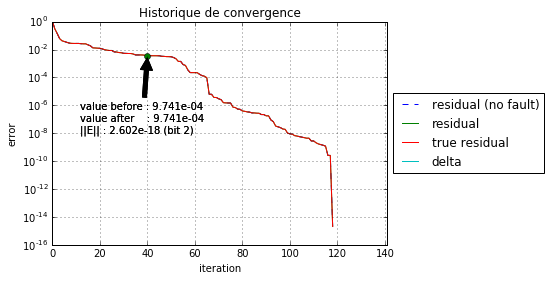

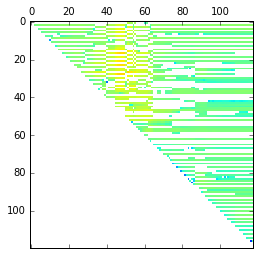

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.0011735758303622512, 'register': 'left', 'timer': 45, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.0011735758303622501, 'check': True}


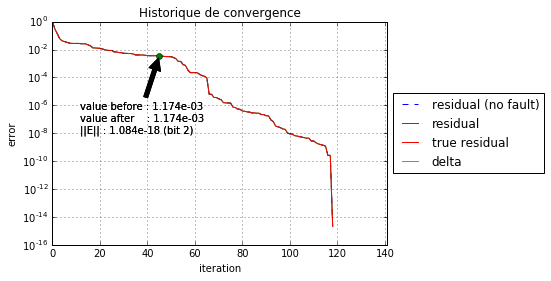

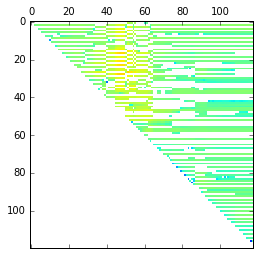

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.00082414865419562391, 'register': 'left', 'timer': 50, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.00082414865419562565, 'check': True}


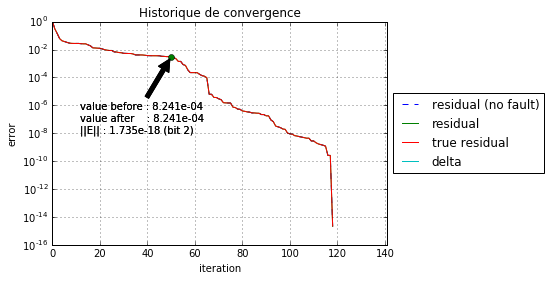

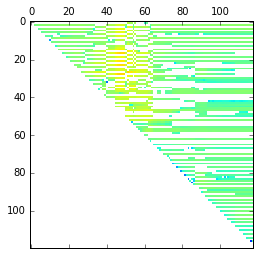

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.0073980646252667448, 'register': 'left', 'timer': 55, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.007398064625266744, 'check': True}


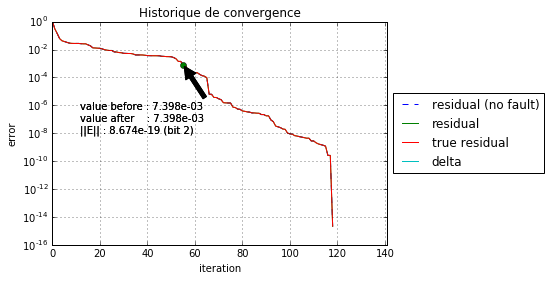

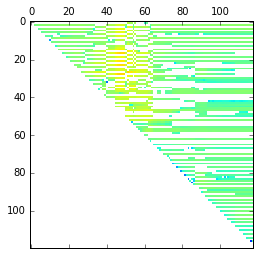

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.00081449421561227762, 'register': 'left', 'timer': 60, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.00081449421561227773, 'check': True}


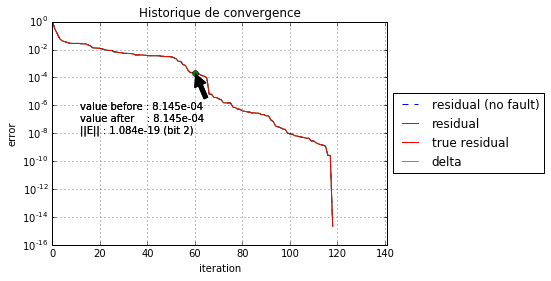

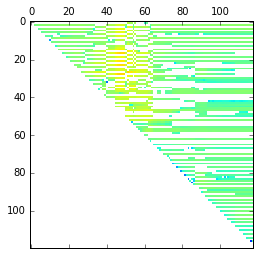

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.0138029949852298, 'register': 'left', 'timer': 65, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.0138029949852298, 'check': True}


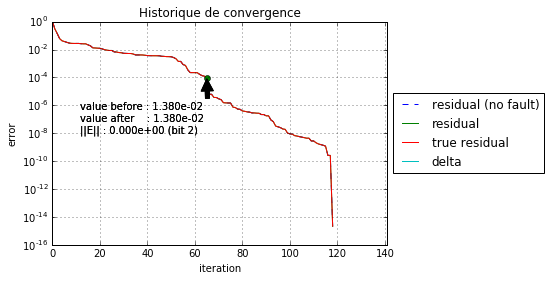

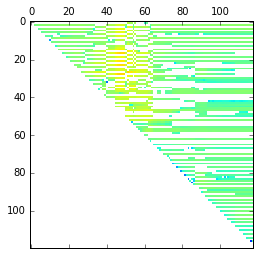

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.00092372842945609565, 'register': 'left', 'timer': 70, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.00092372842945609554, 'check': True}


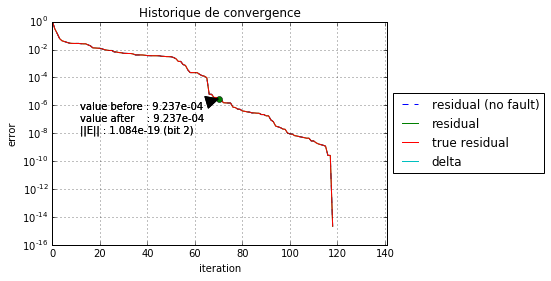

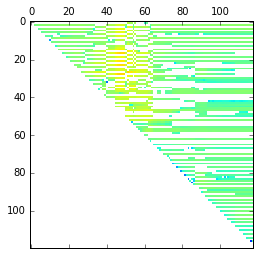

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.00047891475883385788, 'register': 'left', 'timer': 75, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.00047891475883385864, 'check': True}


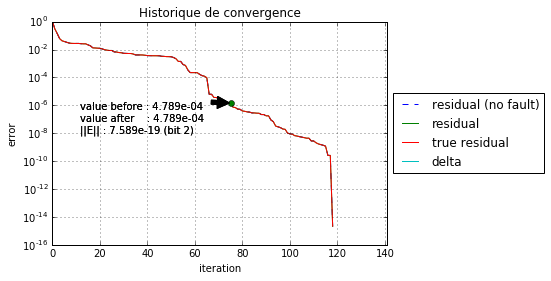

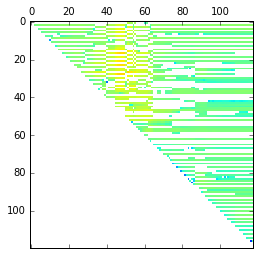

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.0023079640774599768, 'register': 'left', 'timer': 80, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.0023079640774599747, 'check': True}


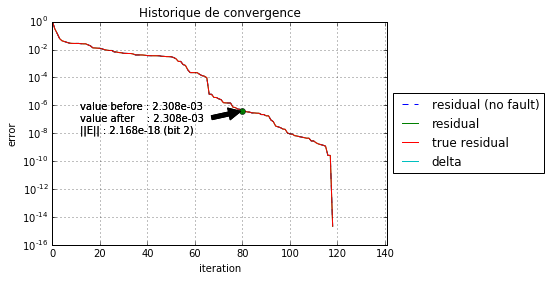

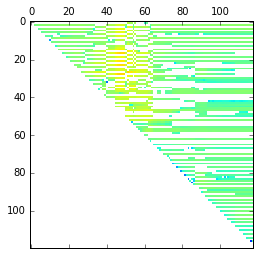

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.0039638678782291199, 'register': 'left', 'timer': 85, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.0039638678782291182, 'check': True}


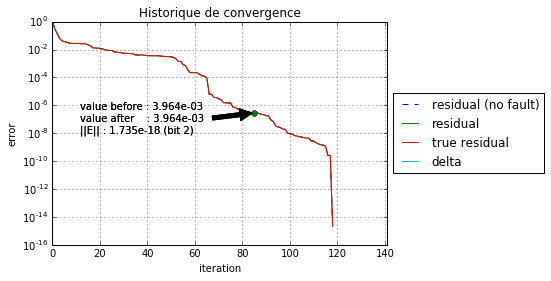

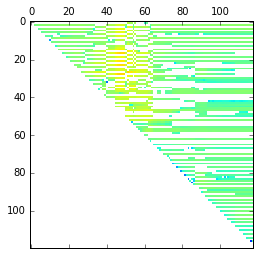

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.00021871457408738926, 'register': 'left', 'timer': 90, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.0002187145740873962, 'check': True}


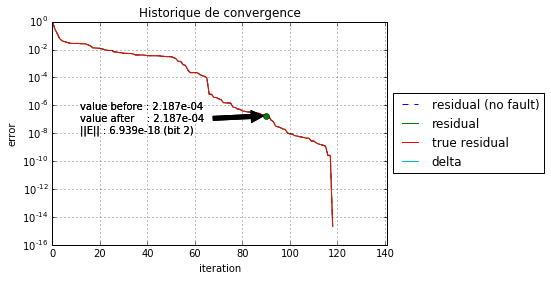

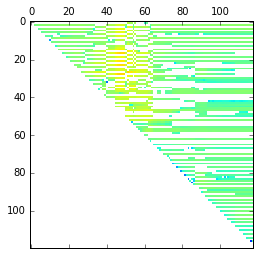

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': -0.010036299055474634, 'register': 'left', 'timer': 95, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': -0.010036299055474634, 'check': True}


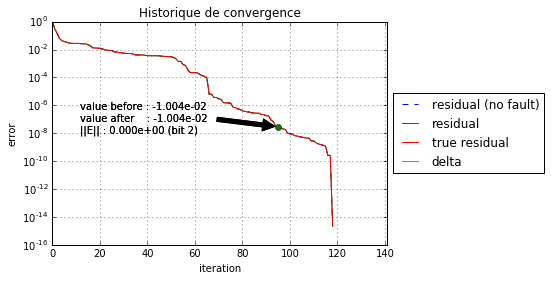

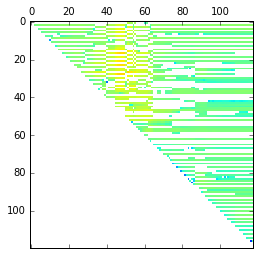

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.0023112017451565798, 'register': 'left', 'timer': 100, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.002311201745156582, 'check': True}


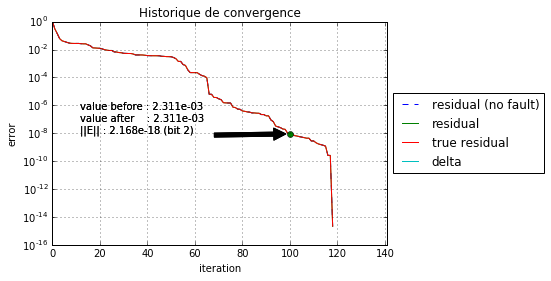

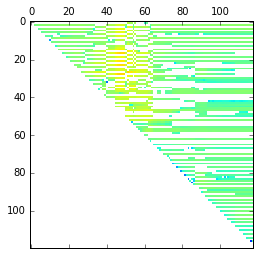

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': 0.0014002782433722757, 'register': 'left', 'timer': 105, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': 0.0014002782433722764, 'check': True}


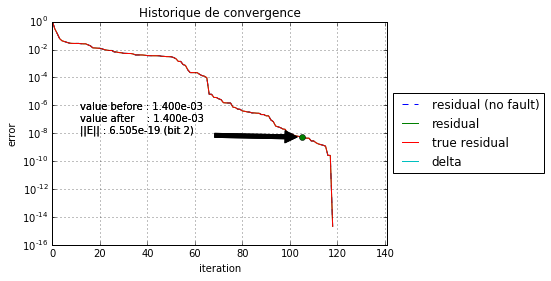

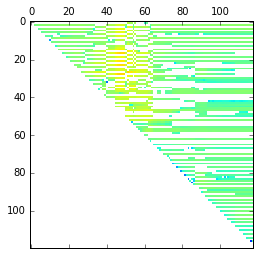

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': -0.00026009371068600704, 'register': 'left', 'timer': 110, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': -0.00026009371068600595, 'check': True}


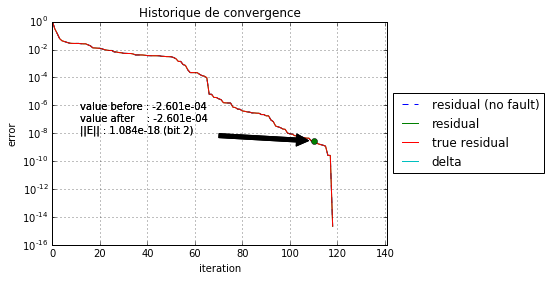

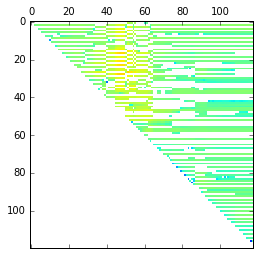

animation
{'register_before': -0.062761200000000003, 'loc': {'i': 58, 'k': 54, 'j': 0}, 'value_before': -0.00023017705442031084, 'register': 'left', 'timer': 115, 'register_after': -0.06276120000000006, 'bit': 2, 'value_after': -0.00023017705442031068, 'check': True}


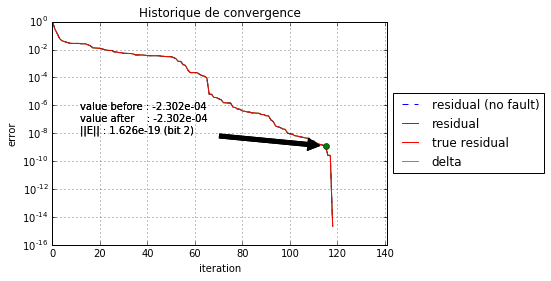

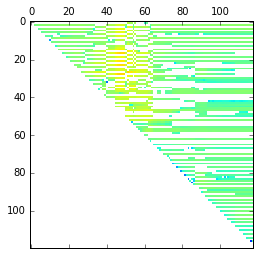

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.024565521624069095, 'register': 'left', 'timer': 0, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.024565525541706049, 'check': None}


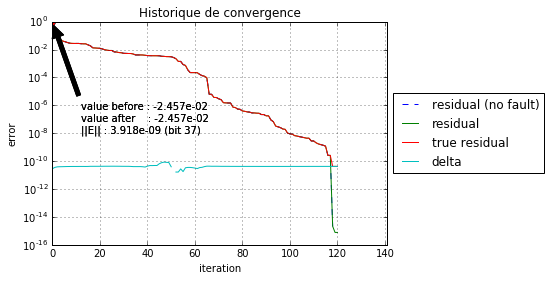

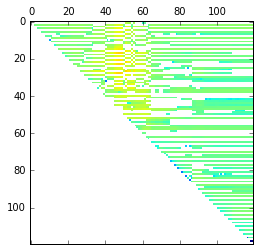

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.027644010851654039, 'register': 'left', 'timer': 5, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.02764401085822682, 'check': None}


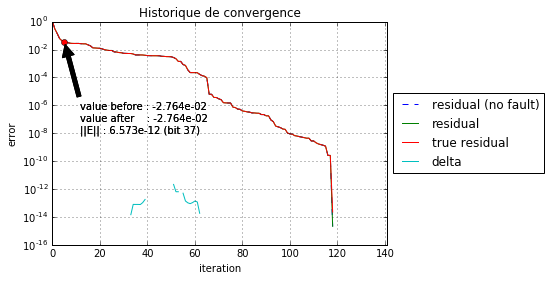

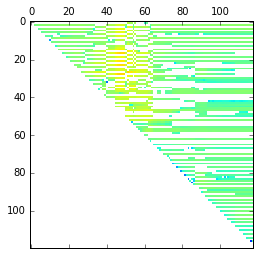

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.016024462761846308, 'register': 'left', 'timer': 10, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.01602446276618779, 'check': None}


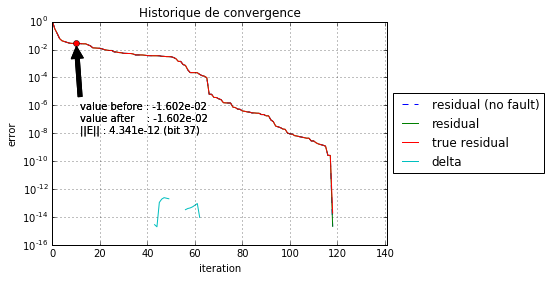

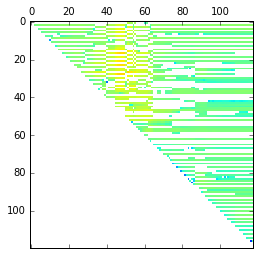

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.048314715504912245, 'register': 'left', 'timer': 15, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.048314715973503904, 'check': None}


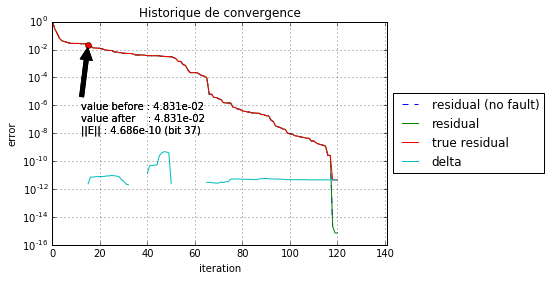

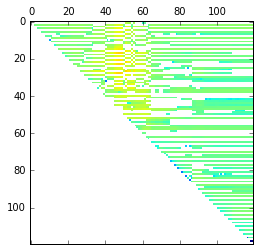

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.014843363931828146, 'register': 'left', 'timer': 20, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.014843364437737505, 'check': None}


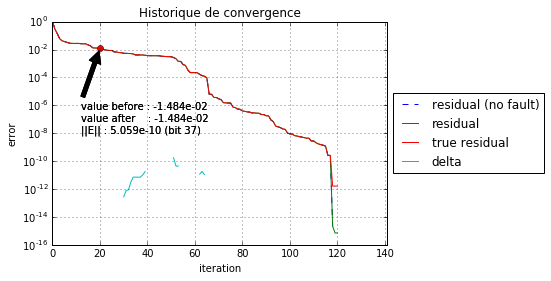

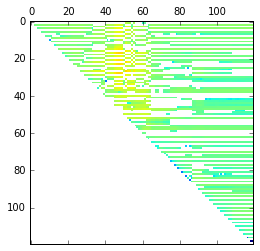

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.0071839557161434107, 'register': 'left', 'timer': 25, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.0071839553269402202, 'check': None}


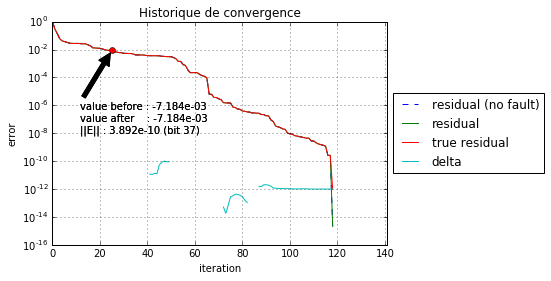

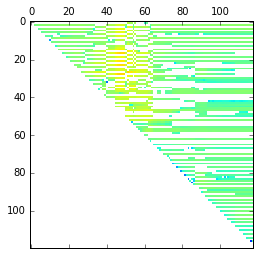

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.089744065312815452, 'register': 'left', 'timer': 30, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.089744065368385195, 'check': None}


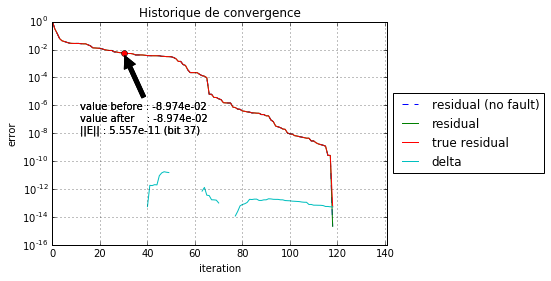

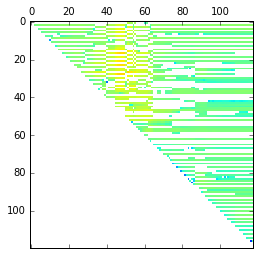

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.030039299313198754, 'register': 'left', 'timer': 35, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.030039299356884066, 'check': None}


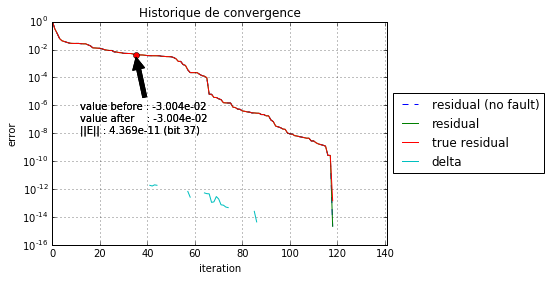

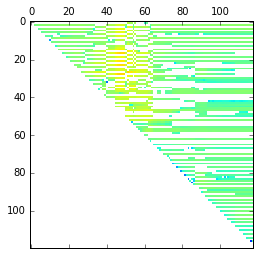

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.28336253636269781, 'register': 'left', 'timer': 40, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.28336253621833118, 'check': None}


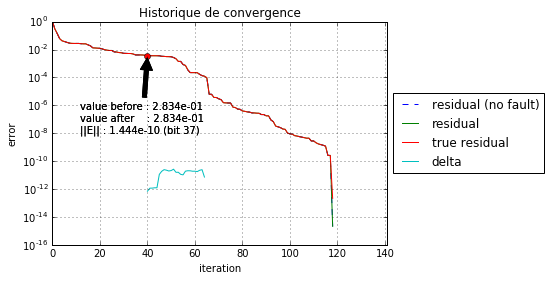

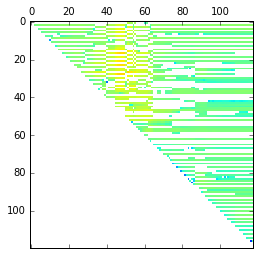

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.093331871772413991, 'register': 'left', 'timer': 45, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.093331871798630589, 'check': None}


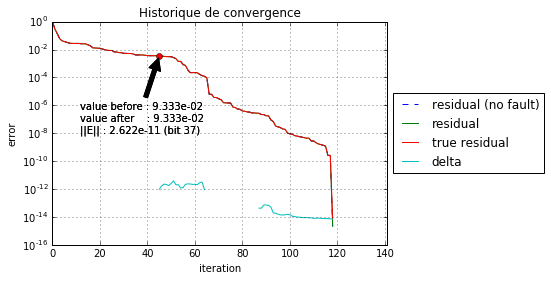

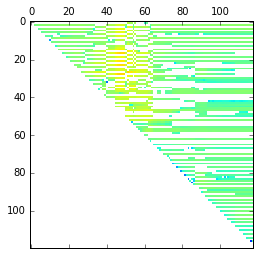

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.24460700240903421, 'register': 'left', 'timer': 50, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.24460700251351841, 'check': None}


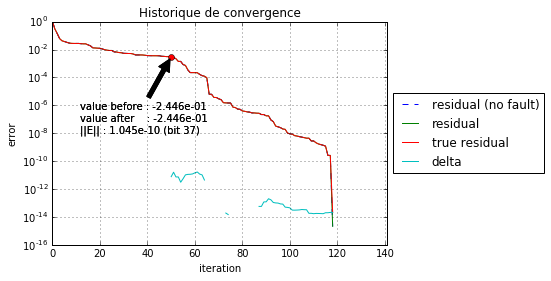

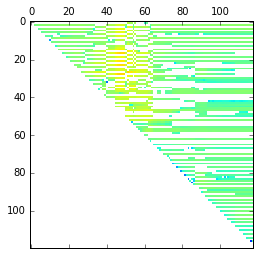

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.069294995058003045, 'register': 'left', 'timer': 55, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.069294995082784375, 'check': None}


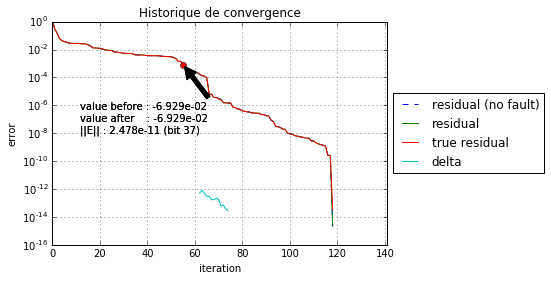

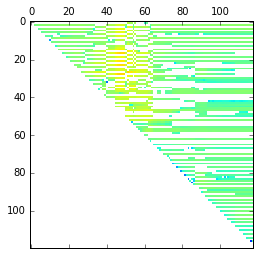

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.21468665557849476, 'register': 'left', 'timer': 60, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.21468665562931311, 'check': None}


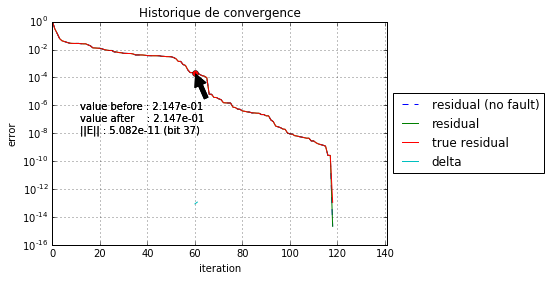

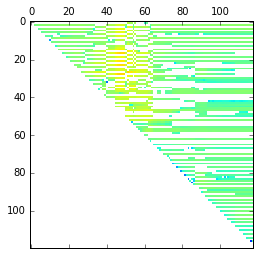

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.58844689048902477, 'register': 'left', 'timer': 65, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.58844689049707932, 'check': None}


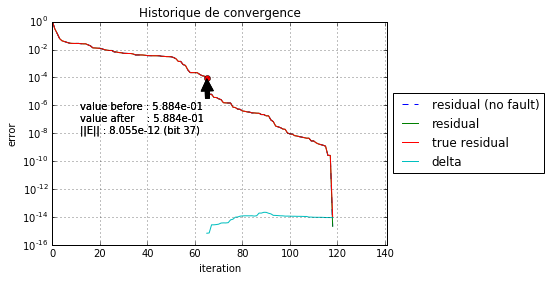

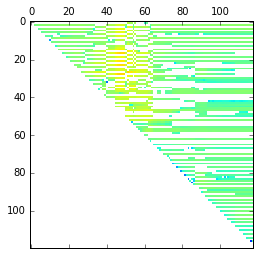

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.049456790627754925, 'register': 'left', 'timer': 70, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.049456790962740076, 'check': None}


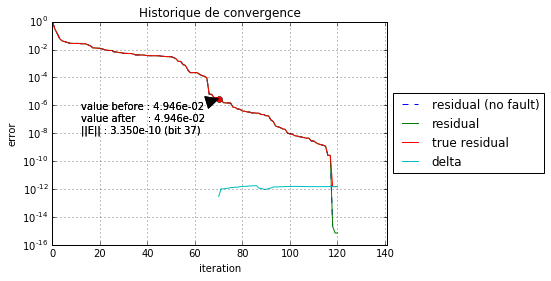

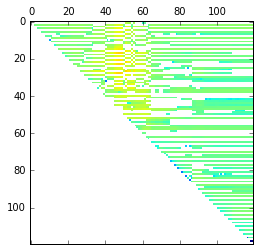

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.053879105188354842, 'register': 'left', 'timer': 75, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.053879105518627485, 'check': None}


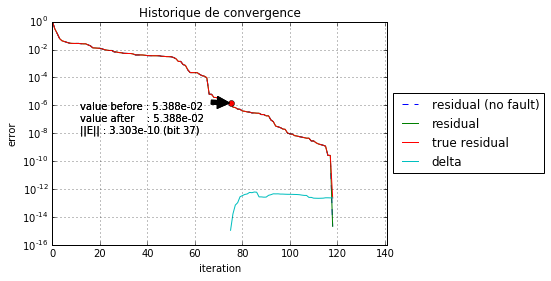

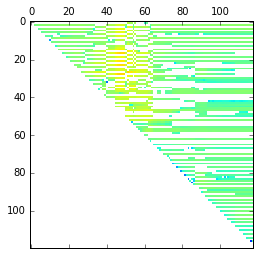

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.062995036499902846, 'register': 'left', 'timer': 80, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.0629950368493781, 'check': None}


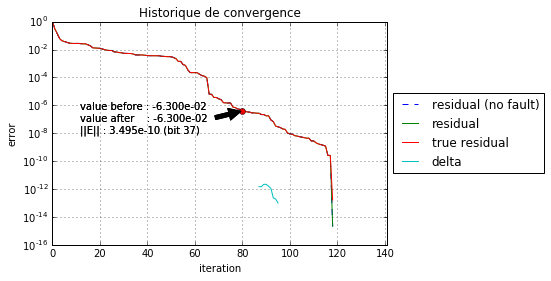

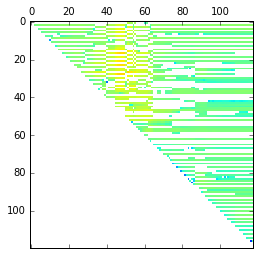

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.15995455565393804, 'register': 'left', 'timer': 85, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.1599545556608559, 'check': None}


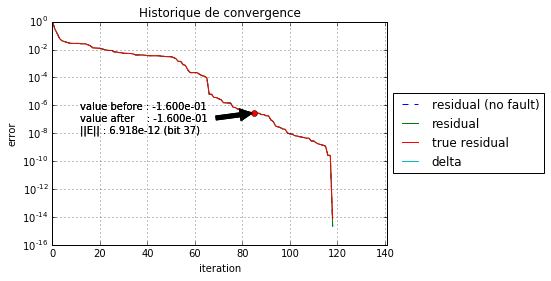

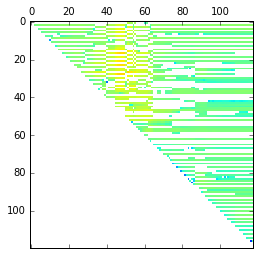

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.055575984963000626, 'register': 'left', 'timer': 90, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.055575984989223434, 'check': None}


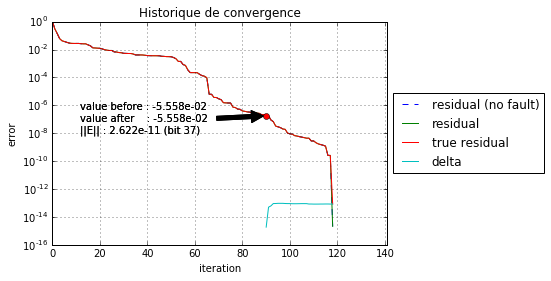

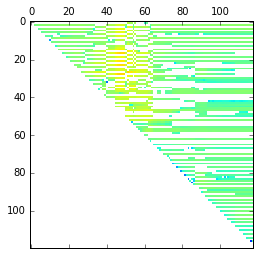

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.05265900584572946, 'register': 'left', 'timer': 95, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.052659005735810949, 'check': None}


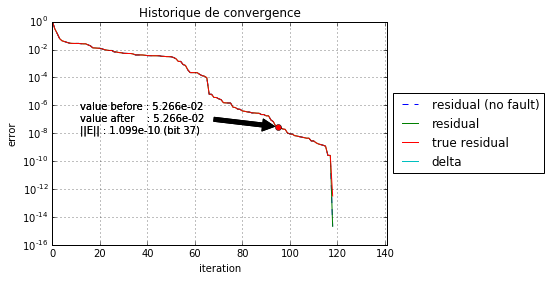

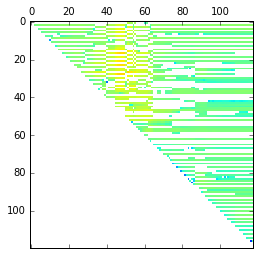

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.041737939411166415, 'register': 'left', 'timer': 100, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.041737939373815806, 'check': None}


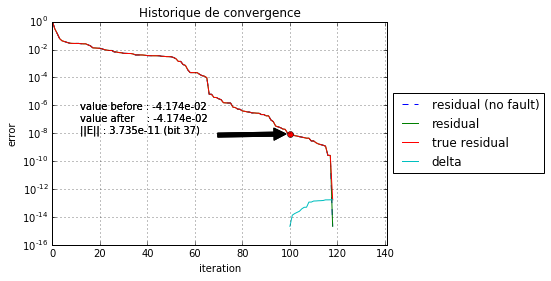

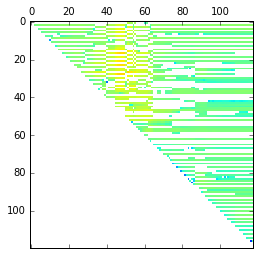

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': -0.072429138974940202, 'register': 'left', 'timer': 105, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': -0.072429139052230487, 'check': None}


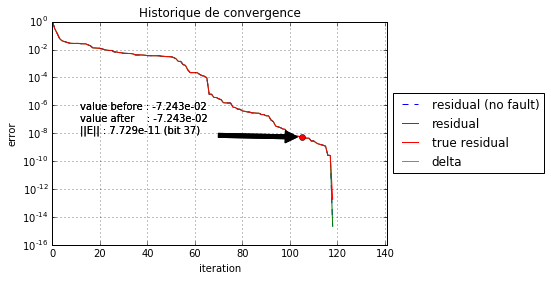

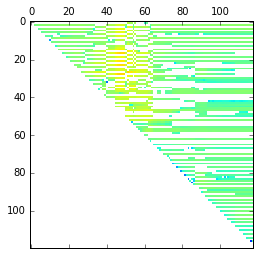

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.10344326953929152, 'register': 'left', 'timer': 110, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.10344326958027894, 'check': None}


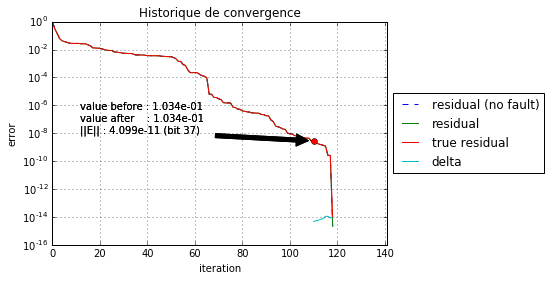

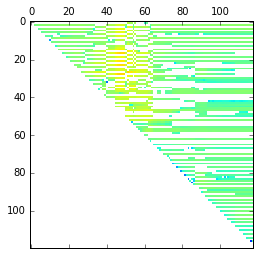

animation
{'register_before': 0.00026054099999999998, 'loc': {'i': 40, 'k': 21, 'j': 0}, 'value_before': 0.031268217077620189, 'register': 'left', 'timer': 115, 'register_after': 0.00026053354941940306, 'bit': 37, 'value_after': 0.031268217087299363, 'check': None}


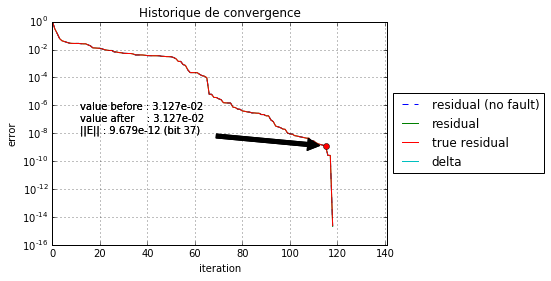

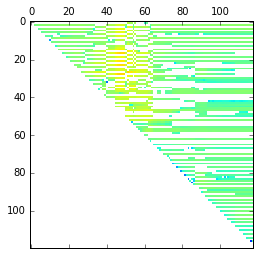

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.047264291220135431, 'register': 'left', 'timer': 0, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -1.7175205154399394e+302, 'check': None}


/usr/lib/python2.7/dist-packages/matplotlib/scale.py:93: RuntimeWarning: invalid value encountered in less_equal
  mask = a <= 0.0


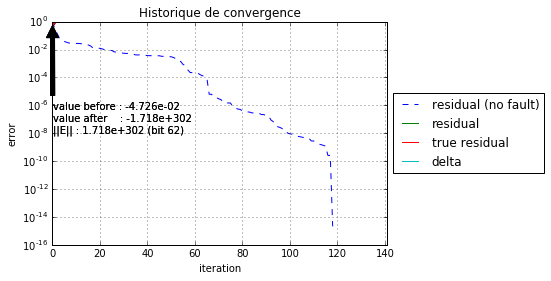

/usr/lib/python2.7/dist-packages/matplotlib/colors.py:1018: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


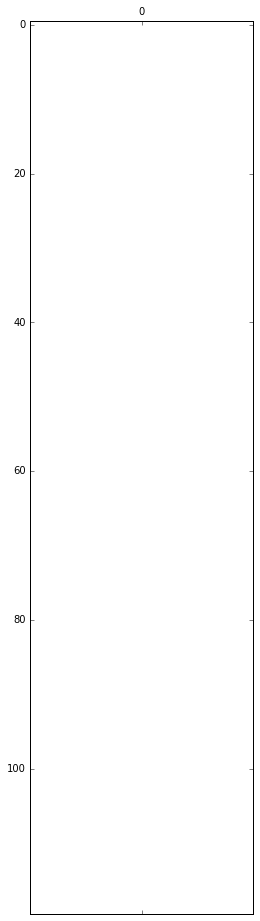

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.037525667269129391, 'register': 'left', 'timer': 5, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 1.6768224514503213e+303, 'check': None}


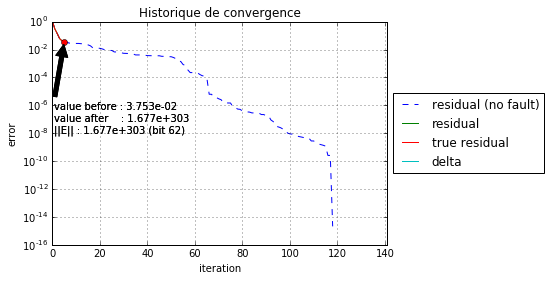

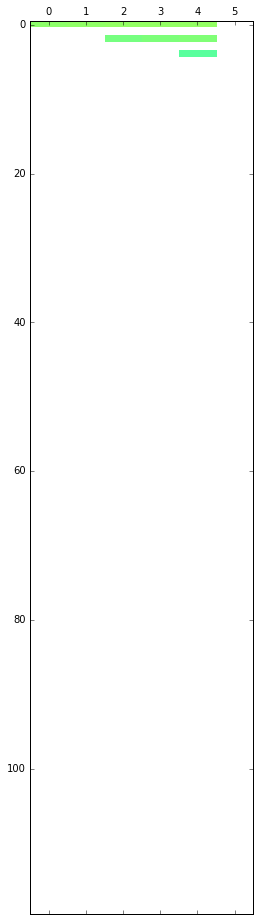

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.045767801413521561, 'register': 'left', 'timer': 10, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 1.0657476326887154e+303, 'check': None}


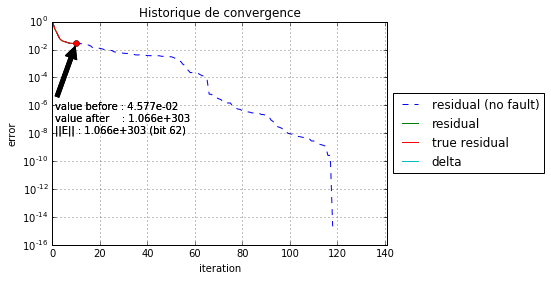

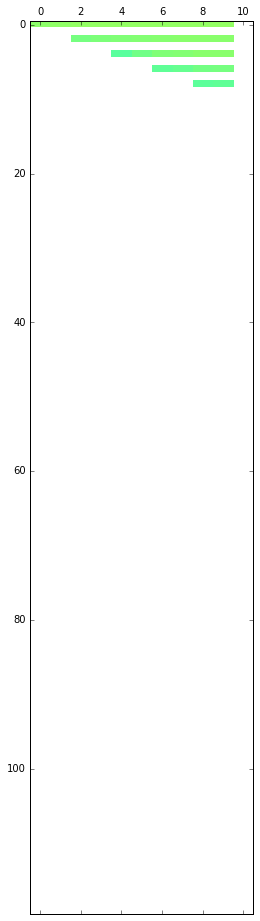

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.019890958751441881, 'register': 'left', 'timer': 15, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -4.7604306728801956e+303, 'check': None}


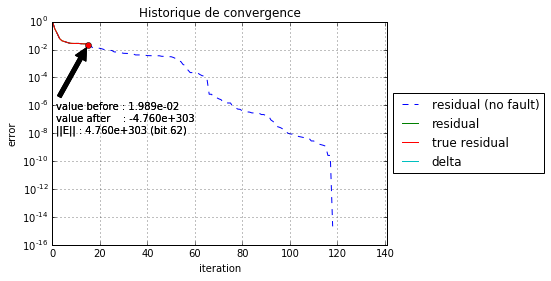

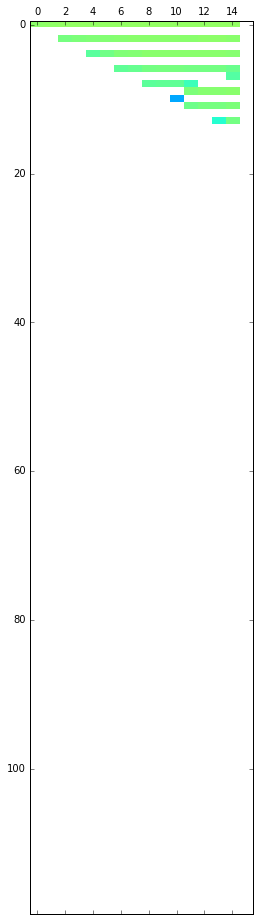

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.15412039115646756, 'register': 'left', 'timer': 20, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -4.0719825816316672e+303, 'check': None}


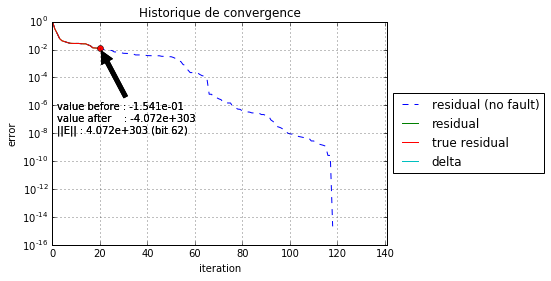

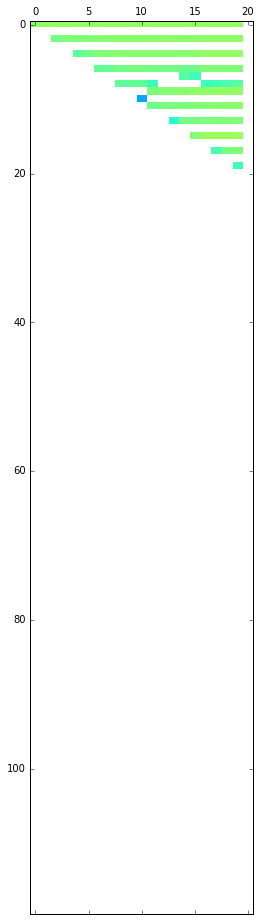

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.0048285754498938746, 'register': 'left', 'timer': 25, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -4.2545974884053011e+303, 'check': None}


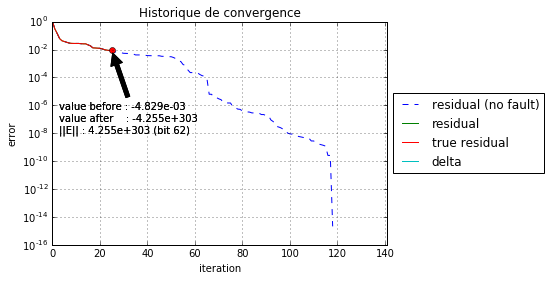

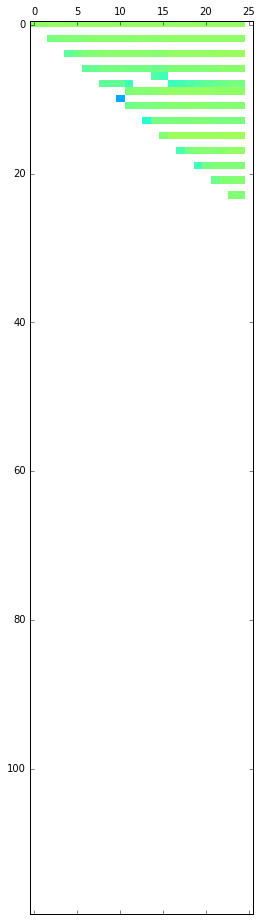

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.054808824184106882, 'register': 'left', 'timer': 30, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 7.5168139664910489e+303, 'check': None}


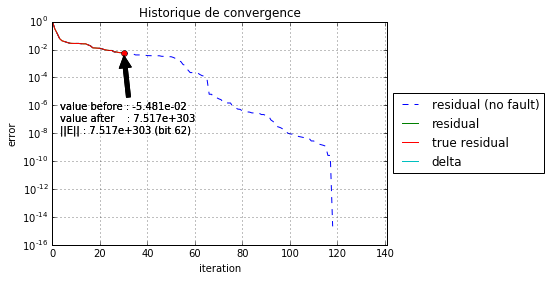

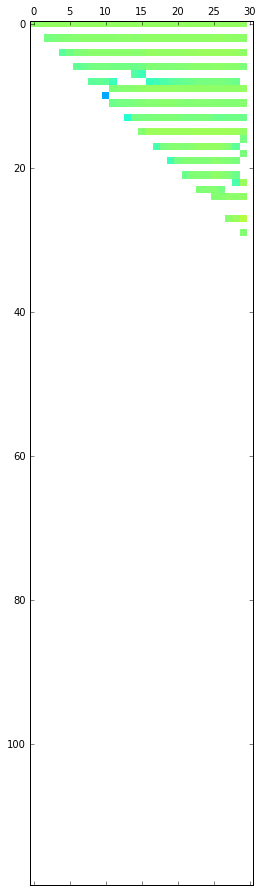

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.01105968358028085, 'register': 'left', 'timer': 35, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -1.0681468052413959e+304, 'check': None}


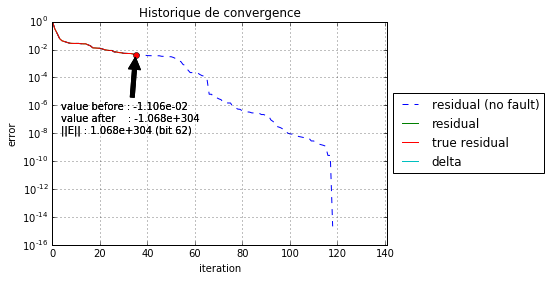

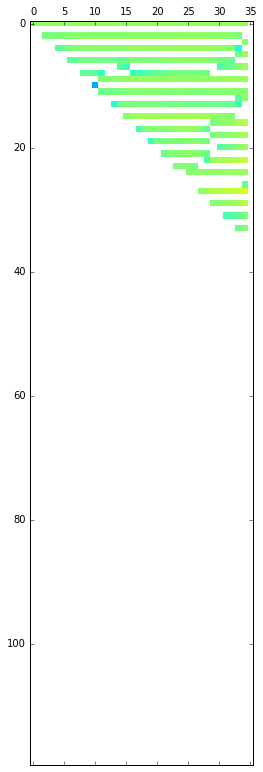

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.026882449952587973, 'register': 'left', 'timer': 40, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -9.3743240721466172e+303, 'check': None}


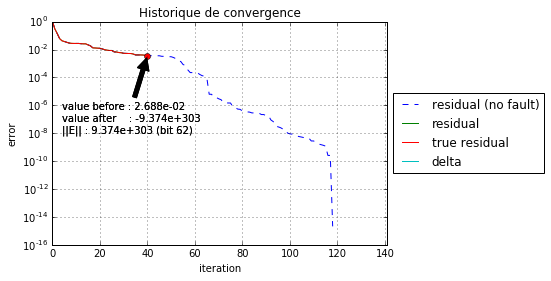

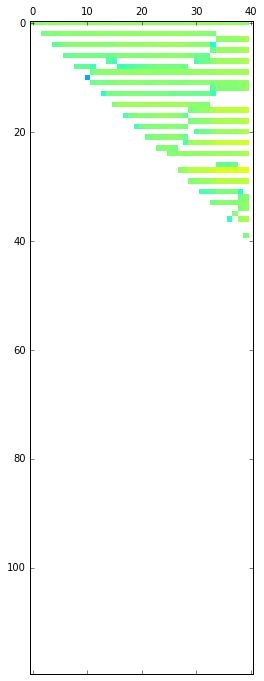

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.021045017900397131, 'register': 'left', 'timer': 45, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -1.4620783916296465e+303, 'check': None}


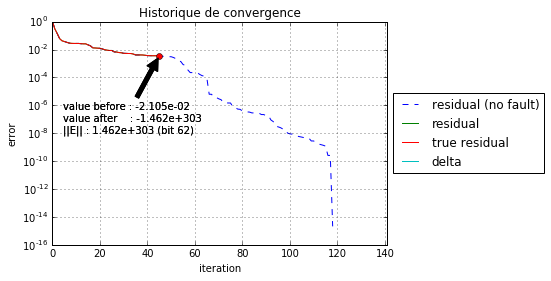

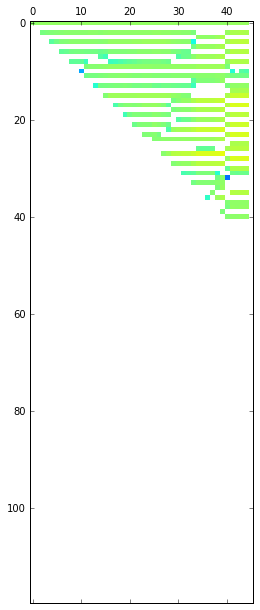

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.013532803186399383, 'register': 'left', 'timer': 50, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 2.1272423896068864e+303, 'check': None}


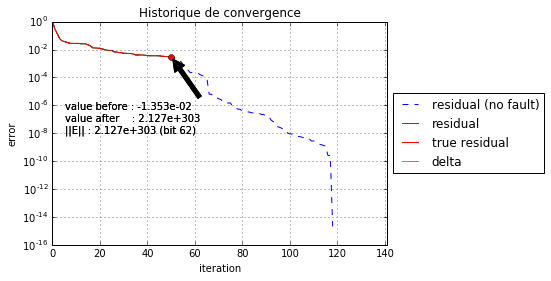

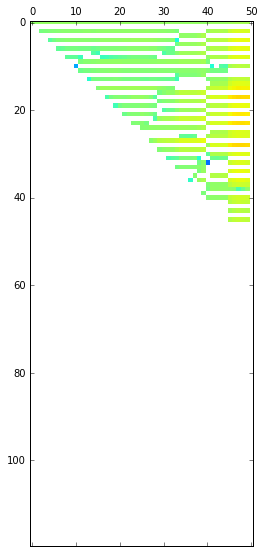

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.039287524007939507, 'register': 'left', 'timer': 55, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -1.2002063860111232e+303, 'check': None}


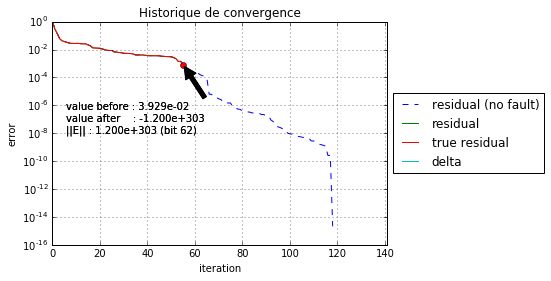

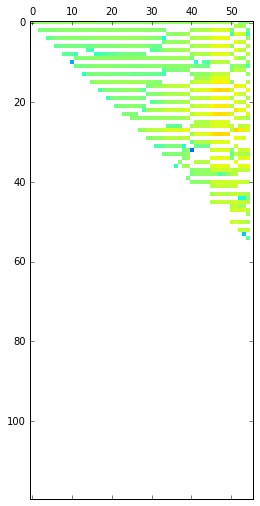

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.033736971687512766, 'register': 'left', 'timer': 60, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 1.0236510301370677e+302, 'check': None}


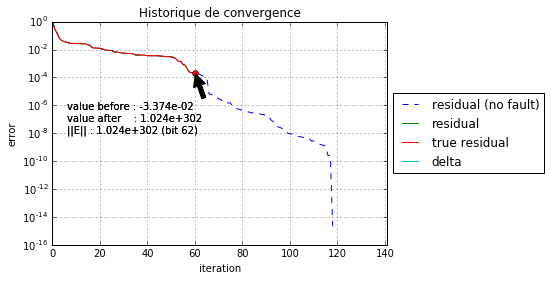

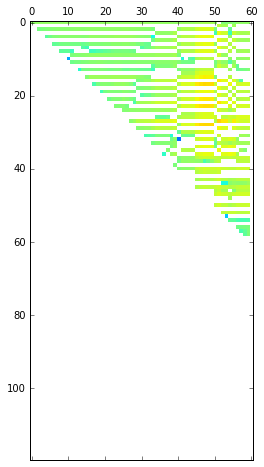

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.035097052366405701, 'register': 'left', 'timer': 65, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 8.0632688875538372e+302, 'check': None}


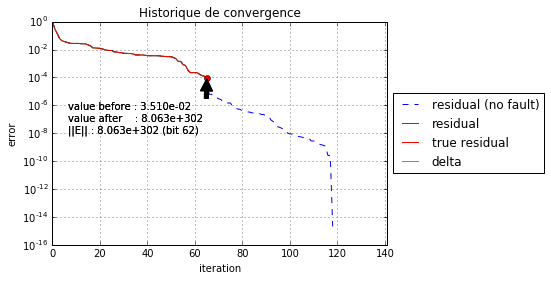

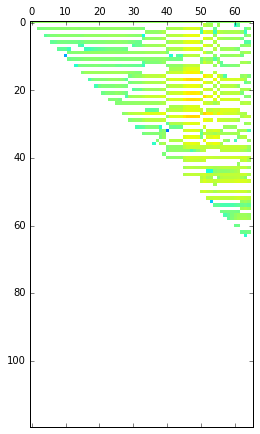

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.2473298590630478, 'register': 'left', 'timer': 70, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 7.3869123213829426e+302, 'check': None}


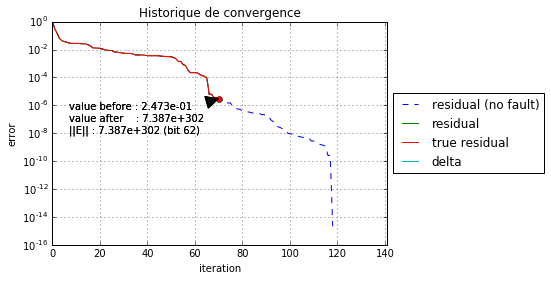

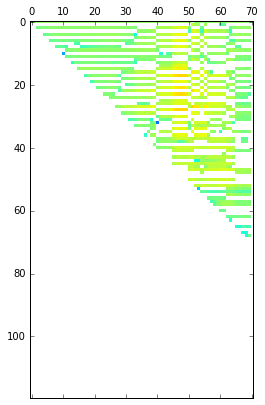

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.036403835155061653, 'register': 'left', 'timer': 75, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 1.8894976219233879e+303, 'check': None}


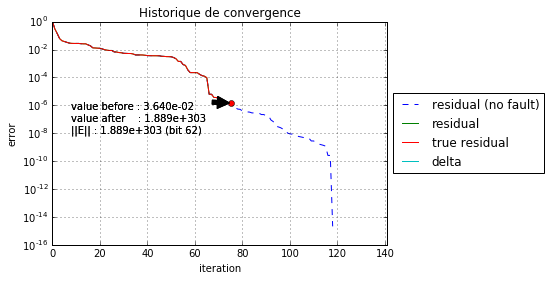

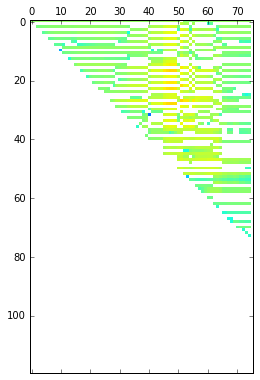

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.0043305030928616726, 'register': 'left', 'timer': 80, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 1.2485948521792071e+302, 'check': None}


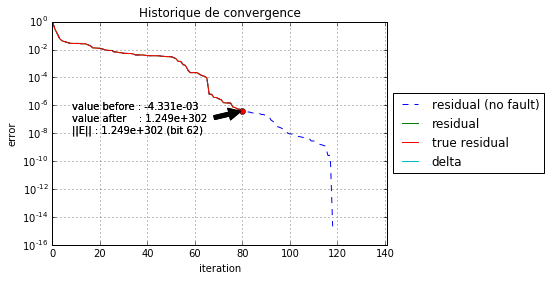

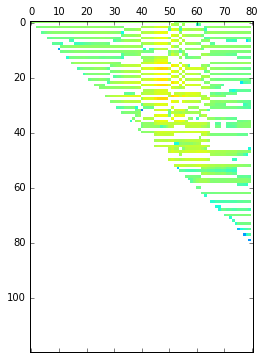

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.060365223990967283, 'register': 'left', 'timer': 85, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': -2.1254540407476114e+302, 'check': None}


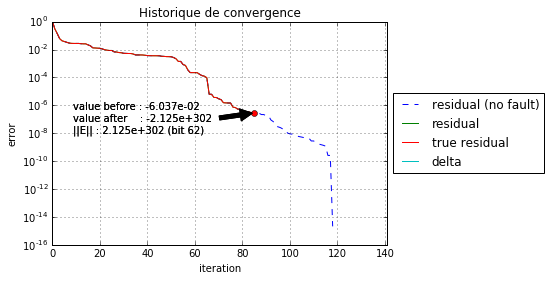

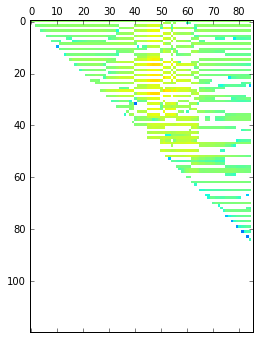

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.0036958738240885016, 'register': 'left', 'timer': 90, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 9.0993793759677658e+301, 'check': None}


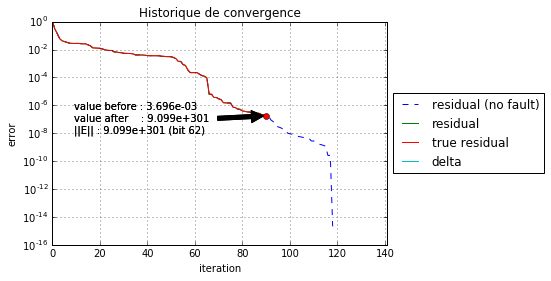

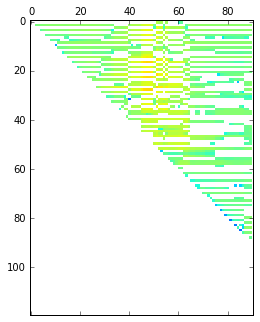

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.015933531632438078, 'register': 'left', 'timer': 95, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 1.960196926470106e+303, 'check': None}


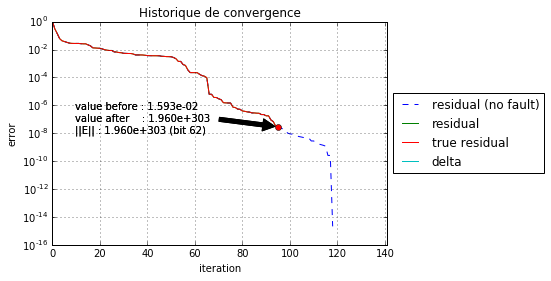

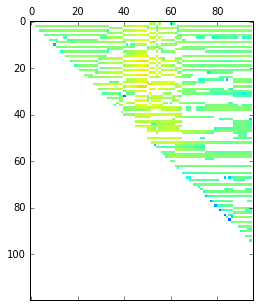

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.0016127796404887143, 'register': 'left', 'timer': 100, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 2.0595181686098668e+303, 'check': None}


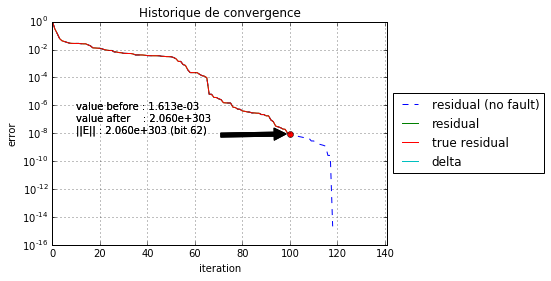

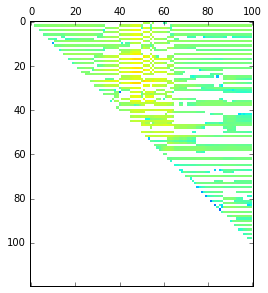

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': -0.0012314763728710422, 'register': 'left', 'timer': 105, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 5.1005604234964219e+303, 'check': None}


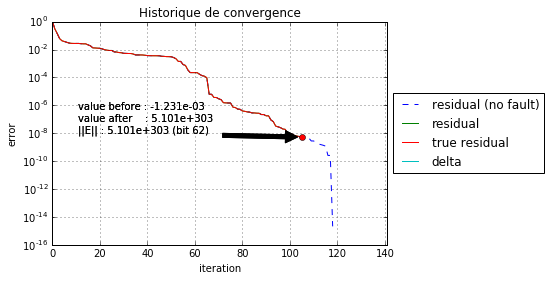

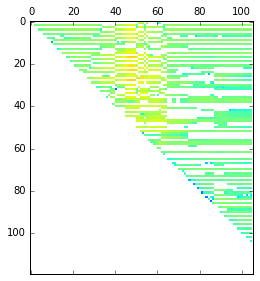

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.0056647641501584474, 'register': 'left', 'timer': 110, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 8.3063703022324739e+303, 'check': None}


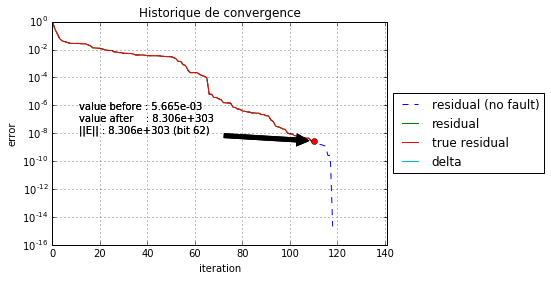

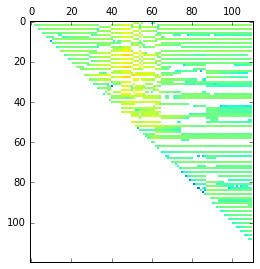

animation
{'register_before': -0.00026041699999999998, 'loc': {'i': 35, 'k': 41, 'j': 0}, 'value_before': 0.00017921225033275414, 'register': 'left', 'timer': 115, 'register_after': -4.681498531014397e+304, 'bit': 62, 'value_after': 4.9151669944308433e+303, 'check': None}


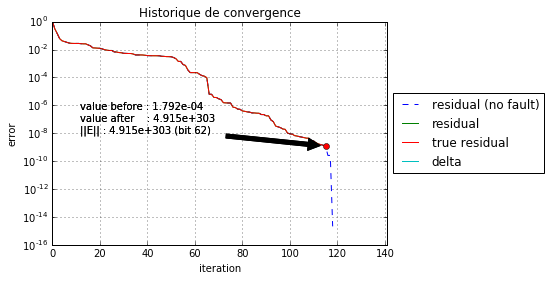

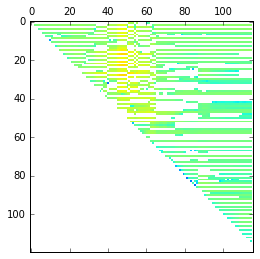

animation
{'register_before': -1.0, 'loc': {'i': 72, 'k': 114, 'j': 0}, 'value_before': -7.439818232684561e-07, 'register': 'left', 'timer': 0, 'register_after': -1.0000000004656613, 'bit': 21, 'value_after': -7.4398182361489967e-07, 'check': None}


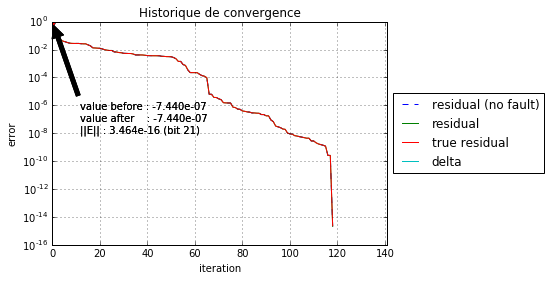

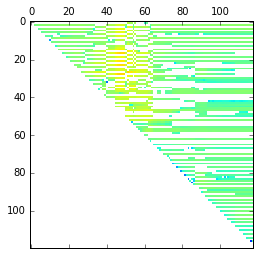

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.023542999553100501, 'register': 'left', 'timer': 5, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.023542999552227516, 'check': None}


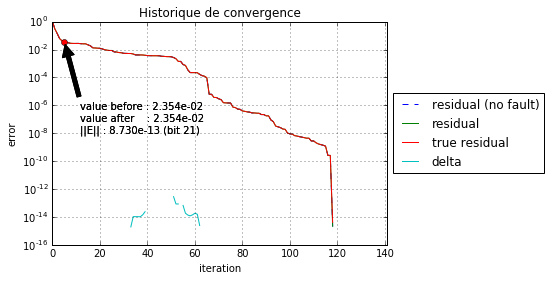

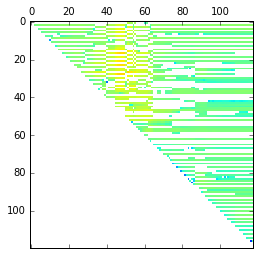

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.064670226245528636, 'register': 'left', 'timer': 10, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.064670226253390695, 'check': None}


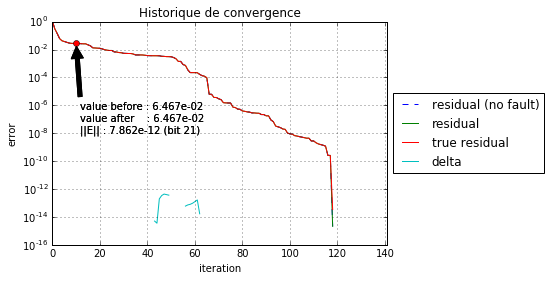

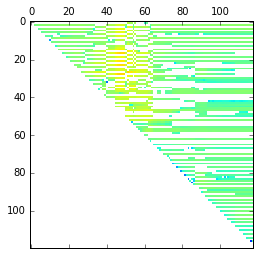

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.22986512021393674, 'register': 'left', 'timer': 15, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.22986512029709399, 'check': None}


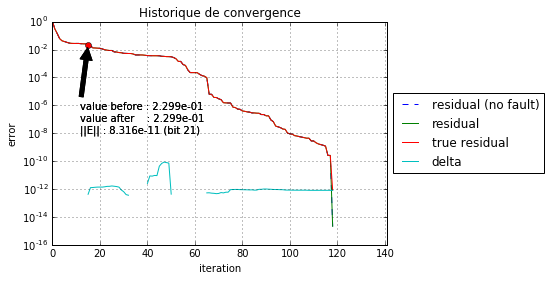

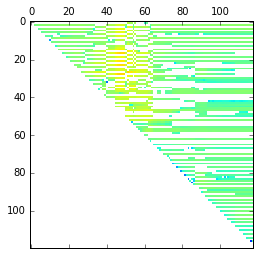

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.083753276228190399, 'register': 'left', 'timer': 20, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.083753276257069201, 'check': None}


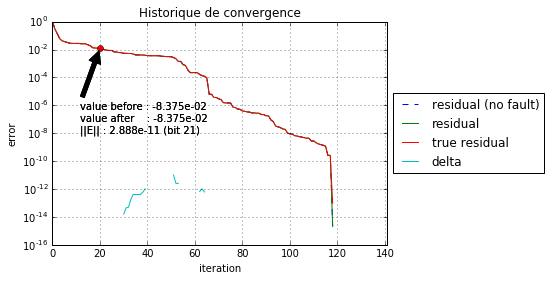

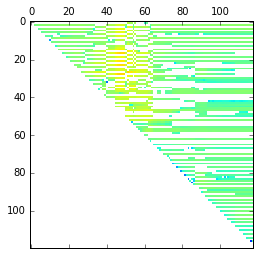

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.10556843327966298, 'register': 'left', 'timer': 25, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.10556843328810819, 'check': None}


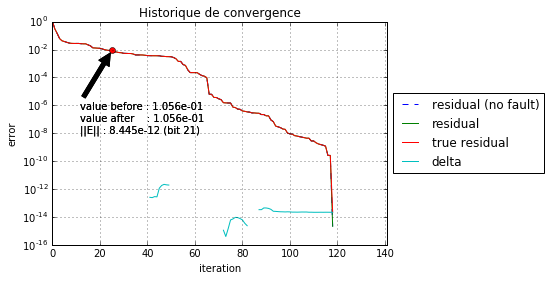

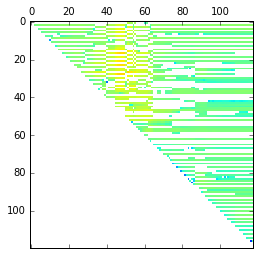

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.30128295410174893, 'register': 'left', 'timer': 30, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.3012829541900689, 'check': None}


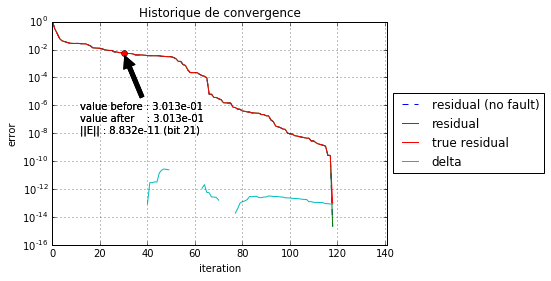

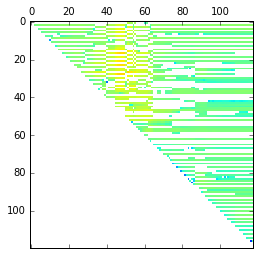

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.077557336164952265, 'register': 'left', 'timer': 35, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.07755733618654613, 'check': None}


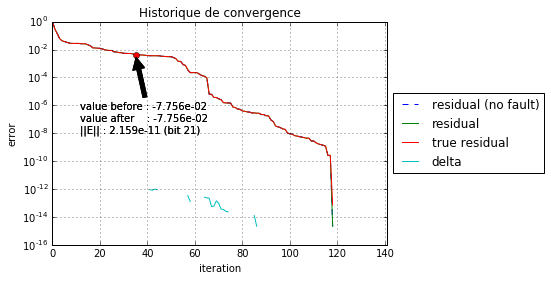

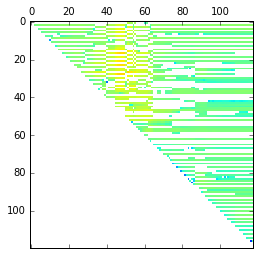

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.018631925545577056, 'register': 'left', 'timer': 40, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.018631925530023241, 'check': None}


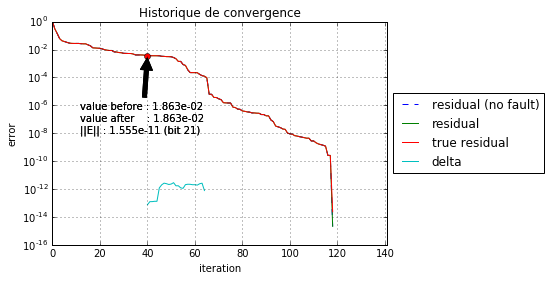

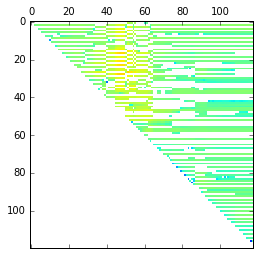

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.025433054817639817, 'register': 'left', 'timer': 45, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.025433054826219558, 'check': None}


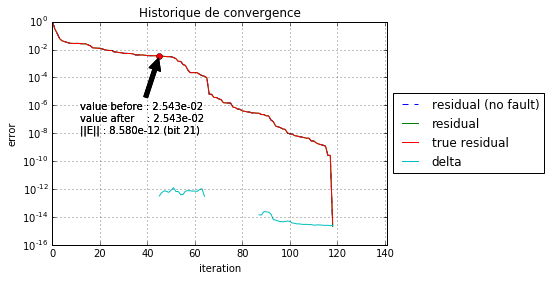

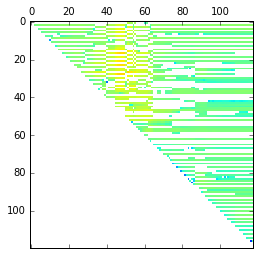

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.039993613710080832, 'register': 'left', 'timer': 50, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.039993613719150153, 'check': None}


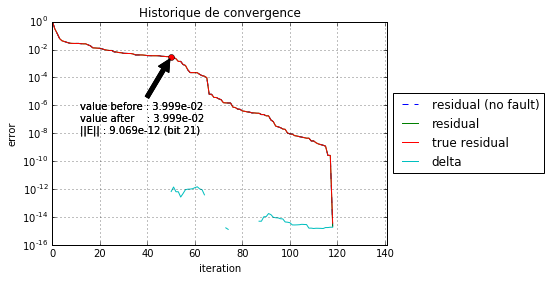

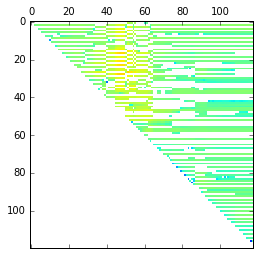

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.036004493818184768, 'register': 'left', 'timer': 55, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.03600449383500956, 'check': None}


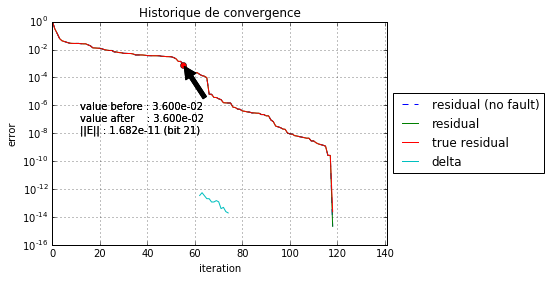

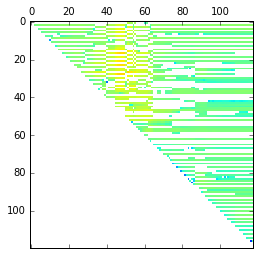

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.026292117971551857, 'register': 'left', 'timer': 60, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.026292118006380233, 'check': None}


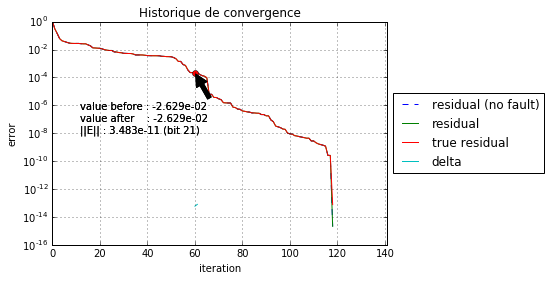

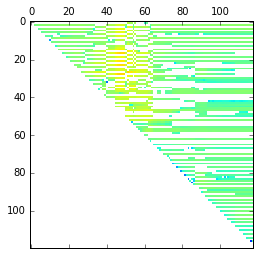

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.010640410919652885, 'register': 'left', 'timer': 65, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.01064041088972037, 'check': None}


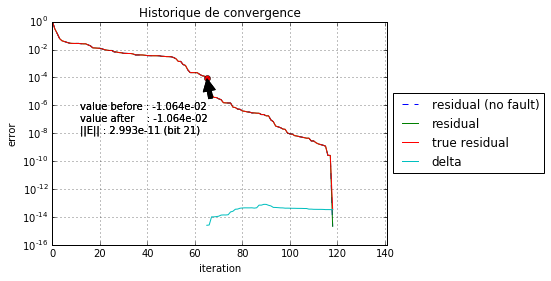

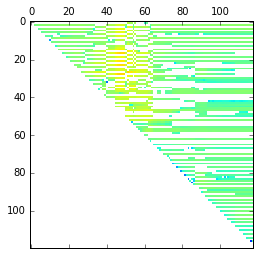

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.017197599685134513, 'register': 'left', 'timer': 70, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.017197599668698958, 'check': None}


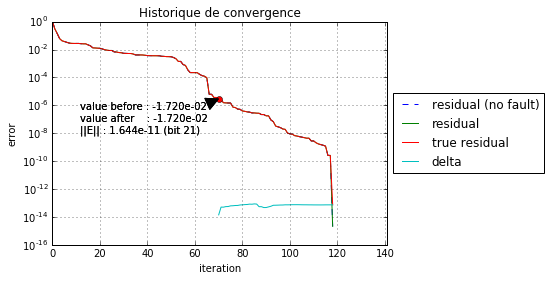

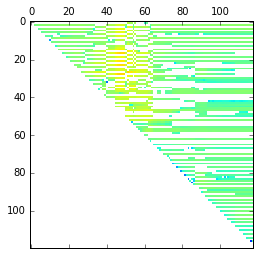

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.029967985844332939, 'register': 'left', 'timer': 75, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.029967985872548751, 'check': None}


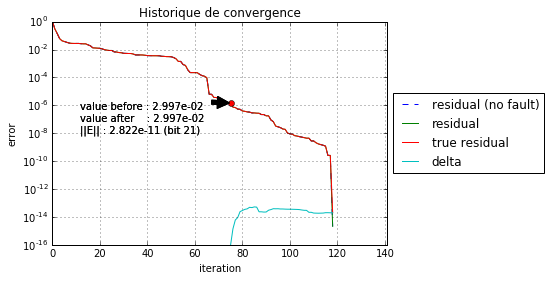

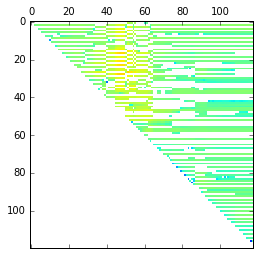

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.12630646997241063, 'register': 'left', 'timer': 80, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.12630646996282244, 'check': None}


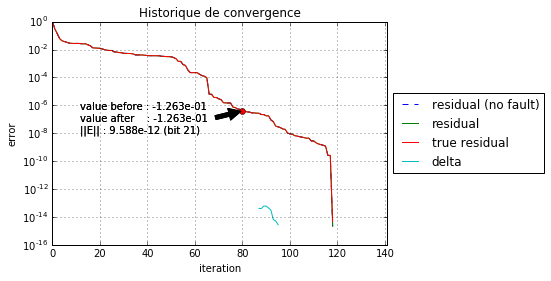

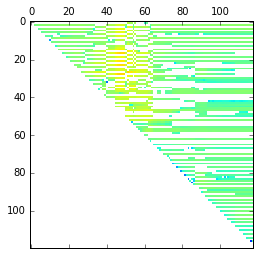

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.11717486312500124, 'register': 'left', 'timer': 85, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.11717486316597768, 'check': None}


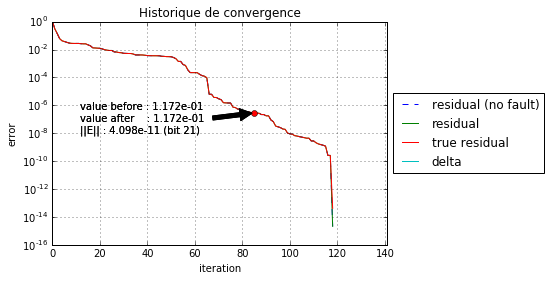

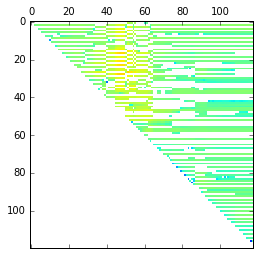

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.70782409340389996, 'register': 'left', 'timer': 90, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.70782409344489916, 'check': None}


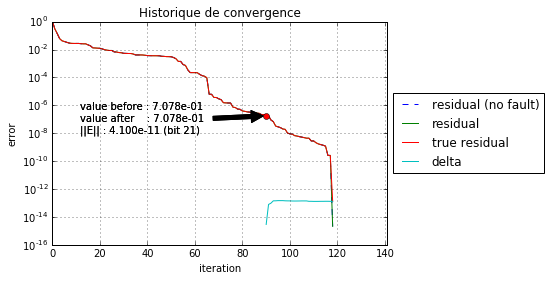

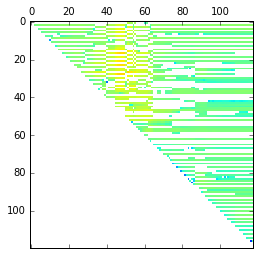

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.31890279636197266, 'register': 'left', 'timer': 95, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.31890279644176178, 'check': True}


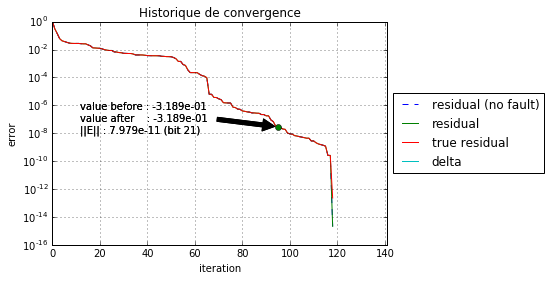

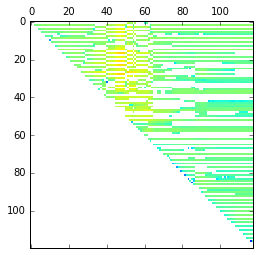

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.3138089531136864, 'register': 'left', 'timer': 100, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.31380895324632868, 'check': True}


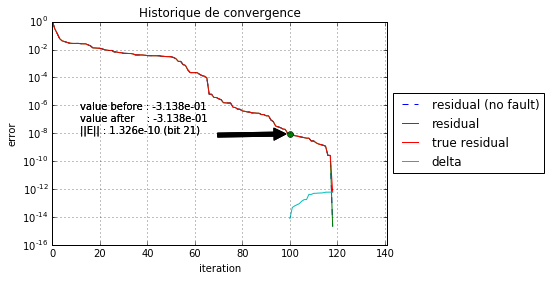

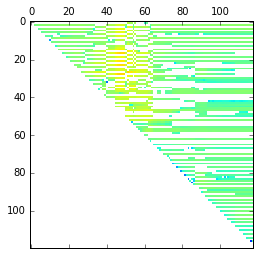

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': -0.065363970013932571, 'register': 'left', 'timer': 105, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': -0.065363970026917212, 'check': True}


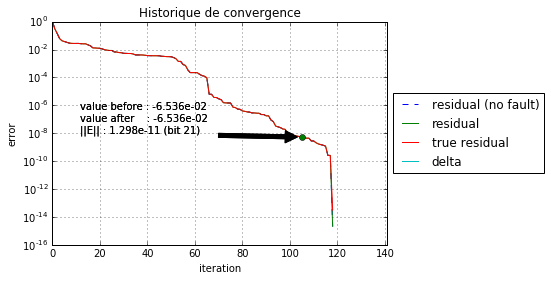

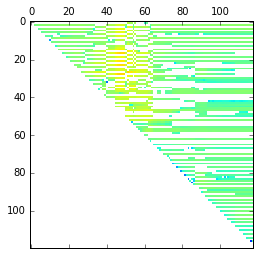

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.17659700616225299, 'register': 'left', 'timer': 110, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.17659700623027993, 'check': True}


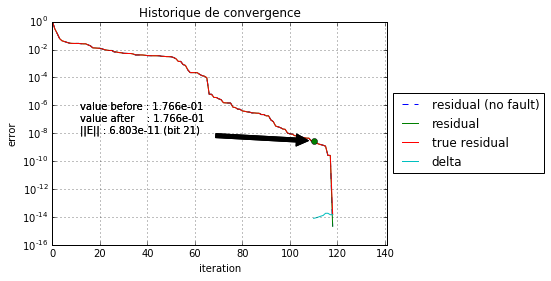

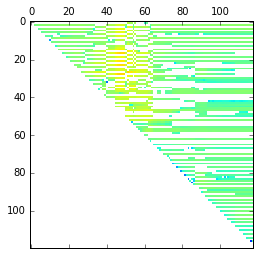

animation
{'register_before': 1.0, 'loc': {'i': 72, 'k': 72, 'j': 0}, 'value_before': 0.018777707938540996, 'register': 'left', 'timer': 115, 'register_after': 1.0000000004656613, 'bit': 21, 'value_after': 0.018777707946368922, 'check': True}


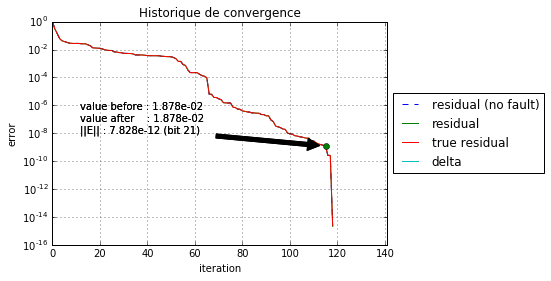

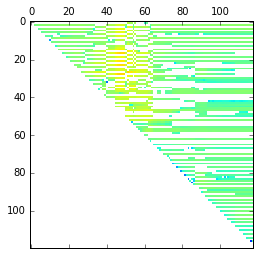

animation


In [19]:
%matplotlib inline

if True:
    
    #data = filter(lambda d: len(d["faults"]) > 0, E.get_data())
    data = filter(lambda d: len(d["faults"]) > 0, E.get_data())
    
    #data_faults = map(lambda d: d["faults"], data)
    data_faults = map(lambda d: d["faults"], data)
    
    #data_H = map(lambda d: d["H"], data)
    #data_V = map(lambda d: d["V"], data)
    #data_orthogonality = map(lambda d: d["orthogonality"], data)
    #data_arnoldi = map(lambda d: d["arnoldi"], data)
    #data_V_ = map(lambda d: d["V_"], data)
    data_iteration = map(lambda d: d["iteration_count"], data)
    data_errors = map(lambda d: d["residuals"], data)
    data_true_errors = map(lambda d: d["true_residuals"], data)
    data_errors_ = map(lambda d: d["residuals"], data)
    data_true_errors_ = map(lambda d: d["true_residuals"], data)
    data_y = map(lambda d: d["y"], data)
    
    
    XT = np.arange(0, F.get_data('iteration_count')[0]+1)
    YT = F.get_data('residuals')[0]
    ZT = F.get_data('true_residuals')[0]
    #OT = F.get_data('orthogonality')[0]
    #AT = F.get_data('arnoldi')[0]
        

    for i in xrange(min(len(data_faults), 200)):
        X = np.arange(0, data_iteration[i]+1)
        Y = data_errors[i]
        Z = data_true_errors[i]
        #O = data_orthogonality[i]
        #A = data_arnoldi[i]
        
        k = data_faults[i][0]["timer"]
        ylk = []
        D = []
        E_norm = abs(data_faults[i][0]["register_after"] - data_faults[i][0]["register_before"])
        Ekvk = abs(data_faults[i][0]["value_after"] - data_faults[i][0]["value_before"])
        
        Y_mat = np.zeros((n, data_iteration[i]))
        for l in xrange(data_iteration[i]):
            yl = data_y[i][min(len(data_y[i])-1, l)]
            if (k > yl.shape[0] - 1):
                ylk += [0.]
            else:
                ylk += [yl[k]]
            for ll in xrange(len(yl)):
                Y_mat[ll, l] = yl[ll]
            for ll in xrange(n-len(yl)):
                Y_mat[ll+len(yl)] = 0
            D += [(ylk[-1] * Ekvk) / np.linalg.norm(b)]
            
        ylk += [ylk[-1]]
        D += [(ylk[-1] * Ekvk) / np.linalg.norm(b)]
        xlim = [0, int(F.get_data('iteration_count')[0] * 1.2)]
        ylim = [1.e-16, 1.e+0]
        xlabel = "iteration"
        ylabel = "error"
        #plot_2D(X, H, log=False, xlim=xlim, ylim=[-2., 2.])
        #plt.show()
        plot_2D(XT, YT, log=True, title='Historique de convergence', label = "residual (no fault)", linestyle='--', xlabel=xlabel, ylabel=ylabel, xlim=xlim, ylim=ylim)  
        
        
        plot_2D(X, Y, log=True, title='Historique de convergence', label = "residual", xlabel=xlabel, xlim=xlim, ylabel=ylabel, ylim=ylim)
        plot_2D(X, Z, log=True, title='Historique de convergence', label = "true residual", xlabel=xlabel, ylabel=ylabel, xlim=xlim, ylim=ylim)
        
        plot_2D(X, D, log=True, title='Historique de convergence', label = "delta", xlabel=xlabel, ylabel=ylabel, xlim=xlim, ylim=ylim)
   

        #plot_2D(XT, OT, log=True, title='Historique de convergence', label = "Orthogonality (no fault)", linestyle='--')  
        #plot_2D(X, O, log=True, title='Historique de convergence', label = "Orthogonality")
  
        #plot_2D(XT, AT, log=True, title='Historique de convergence', label = "Arnoldi equalition (no fault)", linestyle='--')  
        #plot_2D(X, A, log=True, title='Historique de convergence', label = "Arnoldi equalition")
 

        x = (data_faults[i][0]['timer'])
        y = data_true_errors[i][x]
        y_ = data_true_errors_[i][x]
        print data_faults[i][0]
        if data_faults[i][0]["check"]:
            c = "green"
        elif data_faults[i][0]["check"] == False:
            c = "yellow"
        else:
            c = "red"
        plt.plot([x], [y], 'ro', c=c)
        #plt.plot([x], [y_], 'ro', c="green" if data_faults[i][0]["check"] else "red")
        annotation = "value before : %.3e \nvalue after    : %.3e \n||E|| : %.3e (bit %d)" % (data_faults[i][0]['value_before'], 
                                                                                               data_faults[i][0]['value_after'], 
                                                                                               abs(data_faults[i][0]['value_before']-data_faults[i][0]['value_after']),
                                                                                               data_faults[i][0]['bit'])
        plt.annotate(annotation, xy=(x, y), xytext=(1. / 10. * data_iteration[i], 1.e-8),
                arrowprops=dict(facecolor='black', shrink=0.05),)
        plt.annotate(annotation, xy=(x, y_), xytext=(1. / 10. * data_iteration[i], 1.e-8),
                arrowprops=dict(facecolor='black', shrink=0.05),)
        plt.show()
        
        plt.matshow(Y_mat, aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8), cmap=plt.get_cmap('jet'))
        plt.show()
        
        print "animation"
        if False:
            fig1 = plt.figure(figsize = [15,7])
    
            ax1 = fig1.add_subplot(131, autoscale_on=True, title = "H (with fault)")
            ax2 = fig1.add_subplot(132, autoscale_on=True, title = "H (without fault)")
            ax3 = fig1.add_subplot(133, autoscale_on=True, title = "Difference")
    
            fig2 = plt.figure(figsize = [15,7])
    
            ax4 = fig2.add_subplot(131, autoscale_on=True, title = "V (with fault)")
            ax5 = fig2.add_subplot(132, autoscale_on=True, title = "V (without fault)")
            ax6 = fig2.add_subplot(133, autoscale_on=True, title = "Difference")
            
            #fig3 = plt.figure(figsize = [15,7])
    
            #ax7 = fig3.add_subplot(131, autoscale_on=True, title = "V not orthogonalized (with fault)")
            #ax8 = fig3.add_subplot(132, autoscale_on=True, title = "V not orthogonalized (without fault)")
            #ax9 = fig3.add_subplot(133, autoscale_on=True, title = "Difference")
    
    
            iteration = min(F.get_data("iteration_count")[0], data_iteration[i])
    
            ax1.matshow(data_H[i][:iteration+1,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            ax2.matshow(F.get_data("H")[0][:iteration+1,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            cax3 = ax3.matshow(abs(data_H[i][:iteration+1, :iteration]-F.get_data("H")[0][:iteration+1, :iteration])[:iteration+1,:iteration], aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8), cmap=plt.get_cmap('jet'))
    
            ax4.matshow(data_V[i][:,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            ax5.matshow((F.get_data("V")[0])[:,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            cax6 = ax6.matshow(abs(data_V[i][:, :iteration]-F.get_data("V")[0][:, :iteration])[:,:iteration], aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8),  cmap=plt.get_cmap('jet'))
    
            #ax7.matshow(data_V_[i][:,:iteration]._data, aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            #ax8.matshow((F.get_data("V_")[0])[:,:iteration]._data, aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            #cax9 = ax9.matshow(abs(data_V_[i]-F.get_data("V_")[0])[:,:iteration]._data, aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8), cmap=plt.get_cmap('jet'))
    

            fig1.colorbar(cax3)
            fig2.colorbar(cax6)
            #fig3.colorbar(cax9)
        plt.show()